In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from collections import Counter
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import LabelEncoder, StandardScaler, OrdinalEncoder, OneHotEncoder, label_binarize
from sklearn.model_selection import train_test_split, learning_curve, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.ensemble import RandomForestClassifier, StackingClassifier, BaggingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import mutual_info_classif
from sklearn.utils.class_weight import compute_class_weight
from sklearn.inspection import PartialDependenceDisplay
from sklearn.utils import class_weight


from imblearn.over_sampling import RandomOverSampler, SMOTENC
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical

from keras_tuner import RandomSearch
import xgboost as xgb
from xgboost import XGBClassifier, Booster
from catboost import CatBoostClassifier, Pool
from pyswarm import pso
from anytree import Node, RenderTree
from anytree.exporter import DotExporter

import shap
import lime
import lime.lime_tabular
from IPython.display import HTML, display


### 1.1 Preprocessing

In [49]:
df=pd.read_csv('ObesityDataSet_raw_and_data_sinthetic.csv')
df.columns = df.columns.str.lower()
df.sample(5)


,gender,age,height,weight,family_history_with_overweight,favc,fcvc,ncp,caec,smoke,ch2o,scc,faf,tue,calc,mtrans,nobeyesdad
2062,Female,25.994949,1.593321,110.168166,yes,yes,3.000000,3.000000,Sometimes,no,2.447306,no,0.000454,0.486558,Sometimes,Public_Transportation,Obesity_Type_III
585,Female,17.402028,1.710756,50.000000,no,yes,2.015258,3.300666,Sometimes,no,1.315608,no,0.069802,1.000000,Sometimes,Public_Transportation,Insufficient_Weight
819,Male,23.170309,1.707557,75.306702,yes,yes,2.303367,3.042774,Sometimes,no,1.277636,no,0.944982,0.366126,Sometimes,Public_Transportation,Overweight_Level_I
1019,Female,28.770852,1.532897,65.031879,yes,no,2.000000,1.000000,Sometimes,no,1.000000,no,0.262171,0.000000,no,Public_Transportation,Overweight_Level_II
251,Male,20.000000,1.670000,78.000000,yes,no,2.000000,1.000000,Sometimes,no,3.000000,no,0.000000,0.000000,Frequently,Automobile,Overweight_Level_II


In [50]:
df.rename(columns={
    'calc': 'alc_intake',
    'favc': 'freq_consum_of_high_cal_food',
    'fcvc': 'Freq_of_veg_consum',
    'ncp': 'Num_of_main_meals',
    'scc': 'Consum_of_sweet_drinks',
    'ch2o': 'water_intake',
    'faf': 'Phys_activity_freq',
    'tue': 'Time_using_technology_devices',
    'caec': 'Consum_of_food_between_meals',
    'mtrans': 'Transport_Mode',
    'nobeyesdad': 'Obesity_level'
}, inplace=True)

df.columns = df.columns.str.lower()

In [52]:
df.head()

,gender,age,height,weight,family_history_with_overweight,freq_consum_of_high_cal_food,freq_of_veg_consum,num_of_main_meals,consum_of_food_between_meals,smoke,water_intake,consum_of_sweet_drinks,phys_activity_freq,time_using_technology_devices,alc_intake,transport_mode,obesity_level
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   gender                          2111 non-null   object 
 1   age                             2111 non-null   float64
 2   height                          2111 non-null   float64
 3   weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   freq_consum_of_high_cal_food    2111 non-null   object 
 6   freq_of_veg_consum              2111 non-null   float64
 7   num_of_main_meals               2111 non-null   float64
 8   consum_of_food_between_meals    2111 non-null   object 
 9   smoke                           2111 non-null   object 
 10  water_intake                    2111 non-null   float64
 11  consum_of_sweet_drinks          2111 non-null   object 
 12  phys_activity_freq              21

In [5]:
# --- Check for duplicate rows ---
duplicate_count = df.duplicated().sum()
print(f"\nNumber of duplicate rows: {duplicate_count}")
df = df.drop_duplicates()
print("Duplicates removed. New shape:", df.shape)



Number of duplicate rows: 24
Duplicates removed. New shape: (2087, 17)


In [6]:
# Renaming obesity levels
df['obesity_level'] = df['obesity_level'].replace("Insufficient_Weight", "Under_Weight")
df.loc[df['obesity_level'].isin(['Overweight_Level_I', 'Overweight_Level_II']), 'obesity_level'] = 'Over_weight'
print(df['obesity_level'].value_counts())


obesity_level
Over_weight         566
Obesity_Type_I      351
Obesity_Type_III    324
Obesity_Type_II     297
Normal_Weight       282
Under_Weight        267
Name: count, dtype: int64


In [7]:
# Distribution of features
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    fig = px.histogram(
        df,
        y=col,
        color=col,
        title=f"Distribution of {col}",
        category_orders={col: df[col].value_counts().index.tolist()}
    )
    fig.update_layout(
        yaxis={'categoryorder': 'total ascending'},
        bargap=0.2
    )
    fig.show()


In [8]:
numerical_cols = df.select_dtypes(exclude=['object']).columns
corr_matrix = df[numerical_cols].corr()

fig = px.imshow(
    corr_matrix,
    text_auto=True,
    color_continuous_scale='RdBu',
    title="Correlation Heatmap",
    labels=dict(color="Correlation"),
    template="plotly_white"
)

fig.update_layout(
    width=800,
    height=700
)

fig.show()


In [9]:
# Categorical features vs target
for col in categorical_cols:
    if col != 'obesity_level':
        fig = px.histogram(df, x=col, color='obesity_level',
                           barmode='group',
                           title=f"{col} vs obesity_level",
                           labels={col: col, 'obesity_level': 'Obesity Class'})
        fig.show()


In [10]:
# Balancing the dataset using SMOTENC
cat_cols = ['family_history_with_overweight', 'gender', 'transport_mode',
            'freq_consum_of_high_cal_food', 'consum_of_sweet_drinks', 
            'smoke', 'consum_of_food_between_meals', 'alc_intake']

le_dict = {}
for col in cat_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    le_dict[col] = le 
y_le = LabelEncoder()
y = y_le.fit_transform(df['obesity_level'])


X = df.drop('obesity_level', axis=1)

cat_feature_indices = [X.columns.get_loc(col) for col in cat_cols]

smote_nc = SMOTENC(categorical_features=cat_feature_indices, random_state=42)
X_resampled, y_resampled = smote_nc.fit_resample(X, y)

print("Before SMOTE:", pd.Series(y).value_counts())
print("After SMOTE:", pd.Series(y_resampled).value_counts())



Before SMOTE: 4    566
1    351
3    324
2    297
0    282
5    267
Name: count, dtype: int64
After SMOTE: 0    566
4    566
1    566
5    566
2    566
3    566
Name: count, dtype: int64


In [11]:
# Decoding the resampled data
ds= pd.DataFrame(X_resampled, columns=X.columns)

for col, le in le_dict.items():
    ds[col] = le.inverse_transform(ds[col].astype(int))

y_decoded = y_le.inverse_transform(y_resampled.astype(int))

ds['obesity_level'] = y_decoded
ds.head()

,gender,age,height,weight,family_history_with_overweight,freq_consum_of_high_cal_food,freq_of_veg_consum,num_of_main_meals,consum_of_food_between_meals,smoke,water_intake,consum_of_sweet_drinks,phys_activity_freq,time_using_technology_devices,alc_intake,transport_mode,obesity_level
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Over_weight
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Over_weight


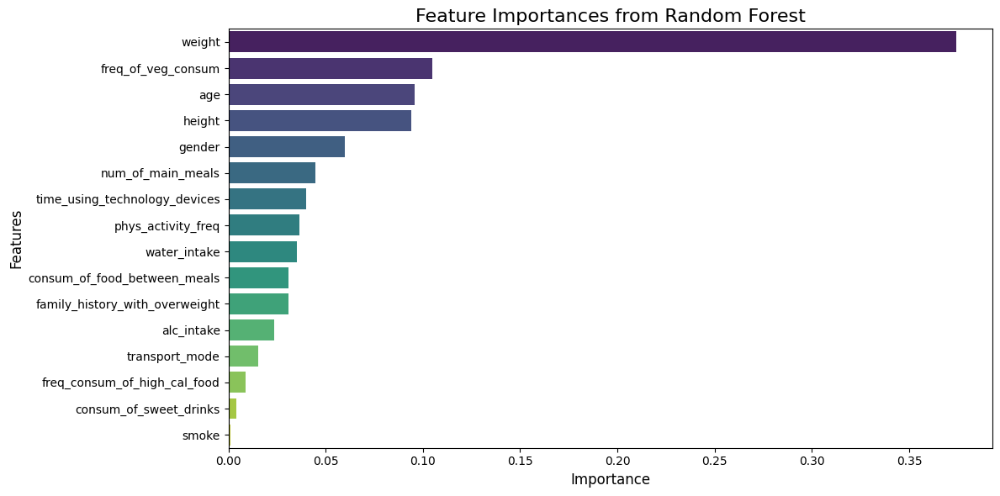

In [12]:
#Feature Importance using Random Forest
X = ds.drop('obesity_level', axis=1)
y = ds['obesity_level']

categorical_cols = X.select_dtypes(include=['object']).columns
for col in categorical_cols:
    X[col] = LabelEncoder().fit_transform(X[col])

y = LabelEncoder().fit_transform(y)

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X, y)

importances = pd.Series(rf.feature_importances_, index=X.columns)
importances = importances.sort_values(ascending=False)

plt.figure(figsize=(12,6))

sns.barplot(x=importances.values, y=importances.index, palette="viridis")

plt.title("Feature Importances from Random Forest", fontsize=16)
plt.xlabel("Importance", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.tight_layout()
plt.show()



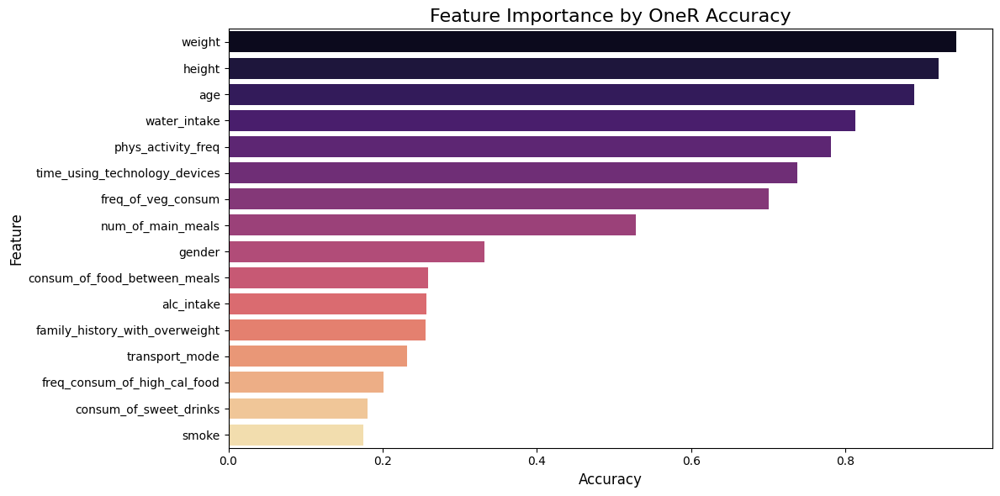

Best feature according to OneR: weight with accuracy: 0.943168433451119


In [13]:

# OneR feature evaluation
oneR_results = {}

for feature in X.columns:
   
    rules = X.groupby(feature).apply(lambda x: pd.Series(y[x.index]).value_counts().idxmax())
    
    y_pred = X[feature].map(rules)

    acc = accuracy_score(y, y_pred)
    oneR_results[feature] = acc

oneR_results = pd.Series(oneR_results).sort_values(ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(x=oneR_results.values, y=oneR_results.index, palette="magma")
plt.title("Feature Importance by OneR Accuracy", fontsize=16)
plt.xlabel("Accuracy", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()

print("Best feature according to OneR:", oneR_results.idxmax(), "with accuracy:", oneR_results.max())


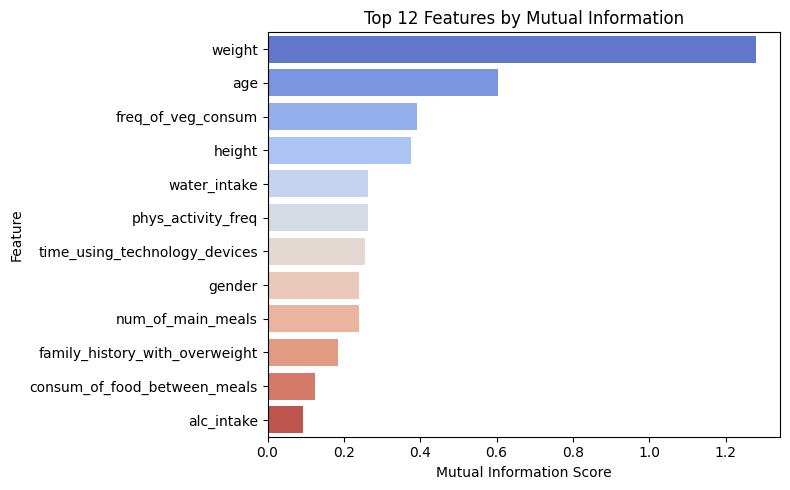

In [14]:
#best features using Mutual Information
mi = mutual_info_classif(X, y, discrete_features='auto', random_state=42)
mi_series = pd.Series(mi, index=X.columns).sort_values(ascending=False)

top_n = 12
top_features_mi = mi_series.head(top_n).index.tolist()

plt.figure(figsize=(8,5))
sns.barplot(x=mi_series[top_features_mi].values, y=top_features_mi, palette="coolwarm")
plt.title(f"Top {top_n} Features by Mutual Information")
plt.xlabel("Mutual Information Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


In [15]:
#dropping less important features
cols_to_drop = ["transport_mode", 
                "freq_consum_of_high_cal_food", 
                "consum_of_sweet_drinks", 
                "smoke"]

df = ds.drop(columns=cols_to_drop, errors="ignore")

### 2. Modelling

In [16]:
# Columns to one-hot encode
one_hot_cols = ['family_history_with_overweight','gender','obesity_level']
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_data = encoder.fit_transform(df[one_hot_cols])
feature_names = encoder.get_feature_names_out(one_hot_cols)
df_encoded = pd.DataFrame(encoded_data, columns=feature_names, index=df.index)
df = pd.concat([df.drop(columns=one_hot_cols), df_encoded], axis=1)

# Ordinal encoder
categories_list = [['no', 'Sometimes', 'Frequently', 'Always']] * 2
encoder = OrdinalEncoder(categories=categories_list)
columns_to_encode = ['consum_of_food_between_meals', 'alc_intake']
df[columns_to_encode] = encoder.fit_transform(df[columns_to_encode])
df.head()


,age,height,weight,freq_of_veg_consum,num_of_main_meals,consum_of_food_between_meals,water_intake,phys_activity_freq,time_using_technology_devices,alc_intake,family_history_with_overweight_no,family_history_with_overweight_yes,gender_Female,gender_Male,obesity_level_Normal_Weight,obesity_level_Obesity_Type_I,obesity_level_Obesity_Type_II,obesity_level_Obesity_Type_III,obesity_level_Over_weight,obesity_level_Under_Weight
0,21.0,1.62,64.0,2.0,3.0,1.0,2.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,21.0,1.52,56.0,3.0,3.0,1.0,3.0,3.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,23.0,1.80,77.0,2.0,3.0,1.0,2.0,2.0,1.0,2.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3,27.0,1.80,87.0,3.0,3.0,1.0,2.0,2.0,0.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,22.0,1.78,89.8,2.0,1.0,1.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:

# Features (exclude one-hot targets)
X = df.drop(columns=[
    'obesity_level_Normal_Weight',
    'obesity_level_Obesity_Type_I',
    'obesity_level_Obesity_Type_II',
    'obesity_level_Obesity_Type_III',
    'obesity_level_Over_weight',
    'obesity_level_Under_Weight'
])

# Convert one-hot targets to single label
y_columns = [
    'obesity_level_Normal_Weight',
    'obesity_level_Obesity_Type_I',
    'obesity_level_Obesity_Type_II',
    'obesity_level_Obesity_Type_III',
    'obesity_level_Over_weight',
    'obesity_level_Under_Weight'
]

y = df[y_columns].idxmax(axis=1)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)


# Train/Val/Test split
from sklearn.model_selection import train_test_split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)


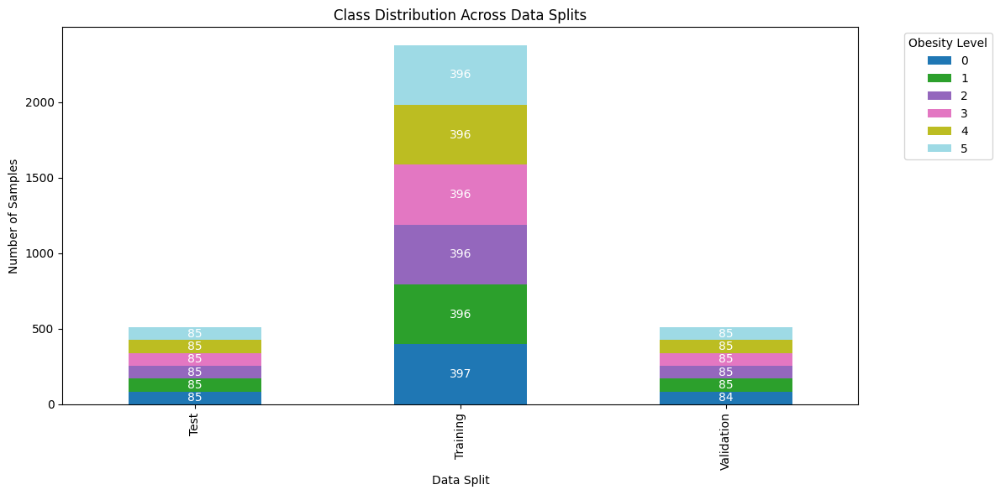

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Combine features and target for easier plotting
train_df = pd.DataFrame({'Set': 'Training', 'Obesity_Level': y_train})
val_df = pd.DataFrame({'Set': 'Validation', 'Obesity_Level': y_val})
test_df = pd.DataFrame({'Set': 'Test', 'Obesity_Level': y_test})

# Concatenate all sets
all_splits = pd.concat([train_df, val_df, test_df])

# Count the number of samples per class in each set
class_counts = all_splits.groupby(['Set', 'Obesity_Level']).size().unstack(fill_value=0)

# Plot stacked bar chart
ax = class_counts.plot(kind='bar', stacked=True, figsize=(12,6), colormap='tab20')
plt.title('Class Distribution Across Data Splits')
plt.ylabel('Number of Samples')
plt.xlabel('Data Split')

# Add counts on top of each segment
for i, set_name in enumerate(class_counts.index):
    cumulative = 0
    for count in class_counts.loc[set_name]:
        if count > 0:
            ax.text(i, cumulative + count/2, str(count), ha='center', va='center', fontsize=10, color='white')
        cumulative += count

plt.legend(title='Obesity Level', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### 2.1 CatBoost

0:	learn: 0.7114009	test: 0.6640472	best: 0.6640472 (0)	total: 165ms	remaining: 2m 44s
100:	learn: 0.9768616	test: 0.9607073	best: 0.9607073 (94)	total: 707ms	remaining: 6.29s
200:	learn: 0.9936895	test: 0.9685658	best: 0.9685658 (162)	total: 1.27s	remaining: 5.05s
300:	learn: 0.9991586	test: 0.9764244	best: 0.9764244 (285)	total: 1.88s	remaining: 4.36s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.9764243615
bestIteration = 285

Shrink model to first 286 iterations.
Train Accuracy: 0.9987
Validation Accuracy: 0.9764
Test Accuracy: 0.9784
Accuracy difference (train - val): 0.0223
Diagnosis: Good fit


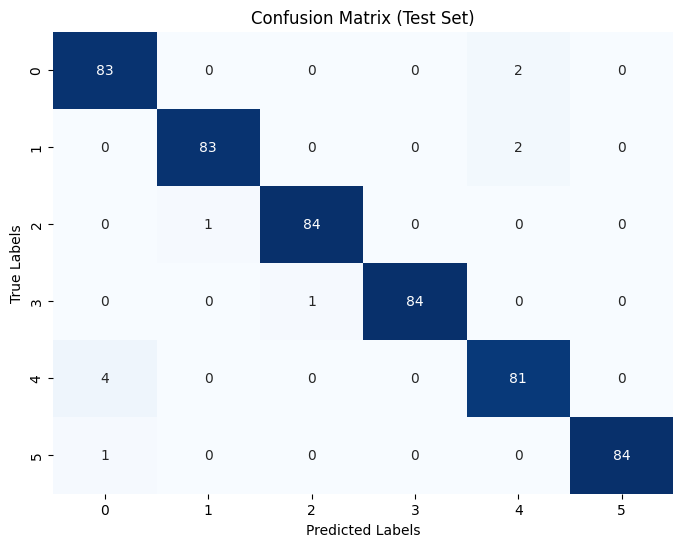

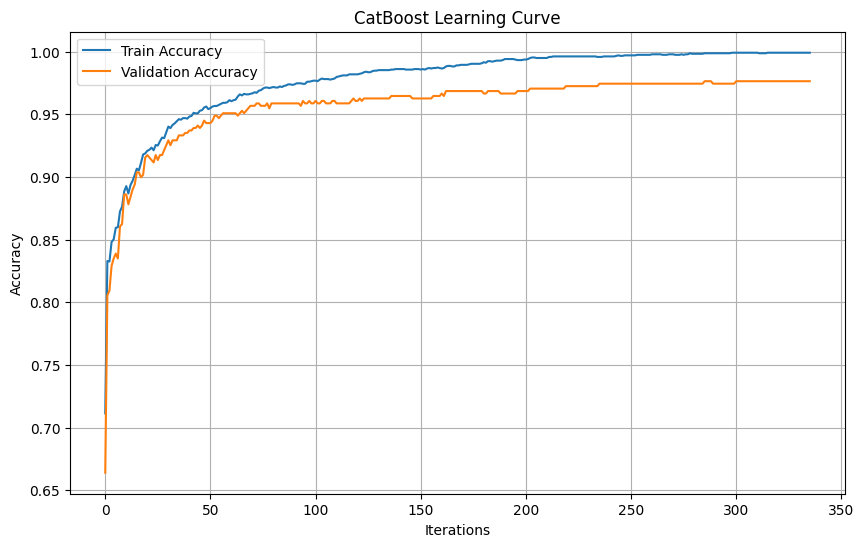

Accuracy : 0.9784
Precision: 0.9787
Recall   : 0.9784
F1 Score : 0.9785
=== Fairness Matrix by Gender ===

Gender: Male
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 0.9756 | 0.0193 | 0.9091
    1 | 1.0000 | 0.0047 | 0.9722
    2 | 0.0000 | 0.0000 | 0.0000
    3 | 1.0000 | 0.0000 | 1.0000
    4 | 0.8974 | 0.0048 | 0.9722
    5 | 1.0000 | 0.0000 | 1.0000

Gender: Female
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 0.9773 | 0.0046 | 0.9773
    1 | 0.9600 | 0.0000 | 1.0000
    2 | 1.0000 | 0.0056 | 0.9882
    3 | 0.0000 | 0.0000 | 0.0000
    4 | 1.0000 | 0.0139 | 0.9388
    5 | 0.9730 | 0.0000 | 1.0000

=== Gender Disparity Summary ===
Class 0: TPR diff = 0.0017, Precision diff = 0.0682
Class 1: TPR diff = 0.0400, Precision diff = 0.0278
Class 2: TPR diff = 1.0000, Precision diff = 0.9882
 Significant disparity detected in Class 2
Class 3: TPR diff = 1.0000, Precision diff = 1.0000
 Significant disparity detected in Class 

In [19]:

#building CatBoost model
cat_model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.05,
    depth=6,
    eval_metric='Accuracy',
    random_seed=42,
    early_stopping_rounds=50,
    verbose=100
)


train_pool = Pool(X_train, y_train)
val_pool = Pool(X_val, y_val)

cat_model.fit(train_pool, eval_set=val_pool, use_best_model=True)


#  Predictions
y_pred = cat_model.predict(X_test)
y_pred_probs = cat_model.predict_proba(X_test)

train_acc = cat_model.score(X_train, y_train)
val_acc = cat_model.score(X_val, y_val)
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting)"
elif diff > 0.1:
    diagnosis = "High variance (overfitting)"
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit"
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting"
else:
    diagnosis = "Validation > Training, unusual case"

#
print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference (train - val): {diff:.4f}")
print(f"Diagnosis: {diagnosis}")

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')


# Confusion Matrix and Sensitivity/Specificity
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 6. Learning Curve Plot

results = cat_model.get_evals_result()
plt.figure(figsize=(10,6))
plt.plot(results['learn']['Accuracy'], label='Train Accuracy')
plt.plot(results['validation']['Accuracy'], label='Validation Accuracy')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.title('CatBoost Learning Curve')
plt.legend()
plt.grid(True)
plt.show()

print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")

# 7. Fairness Metrics by Gender
def fairness_matrix_onehot_gender(y_true, y_pred_probs, X_test_df):
    """
    Computes TPR, FPR, Precision for gender_Female vs gender_Male
    """
    gender_onehot = X_test_df[['gender_Female', 'gender_Male']].values
    gender = np.argmax(gender_onehot, axis=1)  # 0=Male, 1=Female
    y_true_idx = y_true
    y_pred_idx = np.argmax(y_pred_probs, axis=1)
    
    groups = np.unique(gender)
    classes = np.unique(y_true_idx)
    results = {g: {} for g in groups}
    
    for g in groups:
        idx = np.where(gender==g)
        y_true_g = y_true_idx[idx]
        y_pred_g = y_pred_idx[idx]
        for c in classes:
            TP = np.sum((y_pred_g==c) & (y_true_g==c))
            FN = np.sum((y_pred_g!=c) & (y_true_g==c))
            FP = np.sum((y_pred_g==c) & (y_true_g!=c))
            TN = np.sum((y_pred_g!=c) & (y_true_g!=c))
            TPR = TP / (TP+FN) if (TP+FN) > 0 else 0
            FPR = FP / (FP+TN) if (FP+TN) > 0 else 0
            Precision = TP / (TP+FP) if (TP+FP) > 0 else 0
            results[g][c] = {'TPR': TPR, 'FPR': FPR, 'Precision': Precision}
    
    # Print
    print("=== Fairness Matrix by Gender ===")
    for g, class_metrics in results.items():
        gender_name = "Male" if g==0 else "Female"
        print(f"\nGender: {gender_name}")
        print("Class | TPR     | FPR     | Precision")
        print("-"*32)
        for c, metrics in class_metrics.items():
            print(f"{c:5d} | {metrics['TPR']:.4f} | {metrics['FPR']:.4f} | {metrics['Precision']:.4f}")
    
    return results

fairness_results = fairness_matrix_onehot_gender(y_test, y_pred_probs, X_test)

# 8. Gender Disparity Summary
print("\n=== Gender Disparity Summary ===")
num_classes = y_test.max() + 1
for c in range(num_classes):
    tpr_diff = abs(fairness_results[0][c]['TPR'] - fairness_results[1][c]['TPR'])
    precision_diff = abs(fairness_results[0][c]['Precision'] - fairness_results[1][c]['Precision'])
    print(f"Class {c}: TPR diff = {tpr_diff:.4f}, Precision diff = {precision_diff:.4f}")
    if tpr_diff > 0.1 or precision_diff > 0.1:
        print(f" Significant disparity detected in Class {c}")

# Sensitivity (Recall) & Specificity per class
num_classes = cm.shape[0]
sensitivity = []
specificity = []

for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FN + FP)
    
    sens = TP / (TP + FN) if (TP + FN) > 0 else 0
    spec = TN / (TN + FP) if (TN + FP) > 0 else 0
    
    sensitivity.append(sens)
    specificity.append(spec)

for i in range(num_classes):
    print(f"Class {i}: Sensitivity = {sensitivity[i]:.4f}, Specificity = {specificity[i]:.4f}")

# AUC Score (One-vs-Rest)

from sklearn.preprocessing import label_binarize
y_test_bin = label_binarize(y_test, classes=np.arange(num_classes))

# Compute macro-average AUC
auc = roc_auc_score(y_test_bin, y_pred_probs, average='macro', multi_class='ovr')
print(f"\nMacro-Average AUC: {auc:.4f}")




0:	learn: 0.7606226	test: 0.7524558	best: 0.7524558 (0)	total: 8.23ms	remaining: 24.7s
100:	learn: 0.9936895	test: 0.9685658	best: 0.9705305 (97)	total: 606ms	remaining: 17.4s
200:	learn: 0.9987379	test: 0.9783890	best: 0.9783890 (156)	total: 1.38s	remaining: 19.2s
300:	learn: 1.0000000	test: 0.9803536	best: 0.9803536 (218)	total: 1.99s	remaining: 17.9s
Stopped by overfitting detector  (150 iterations wait)

bestTest = 0.9803536346
bestIteration = 218

Shrink model to first 219 iterations.
Train Accuracy: 0.9996
Validation Accuracy: 0.9804
Test Accuracy: 0.9824
Accuracy difference (train - val): 0.0192
Diagnosis: Good fit
Accuracy : 0.9824
Precision: 0.9825
Recall   : 0.9824
F1 Score : 0.9824


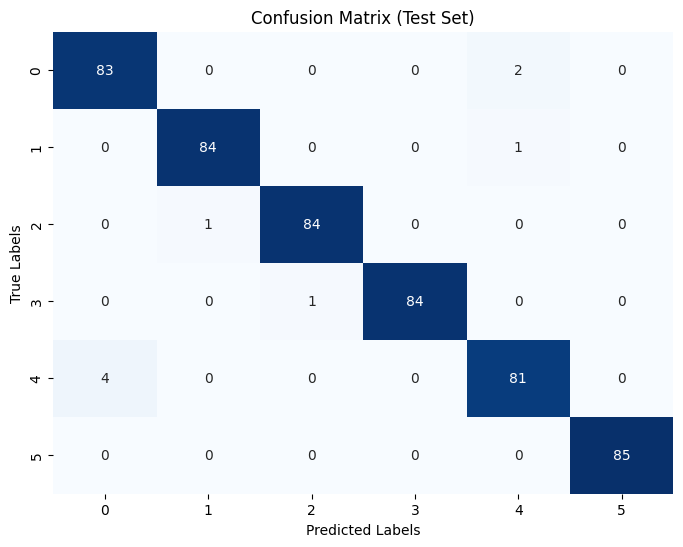

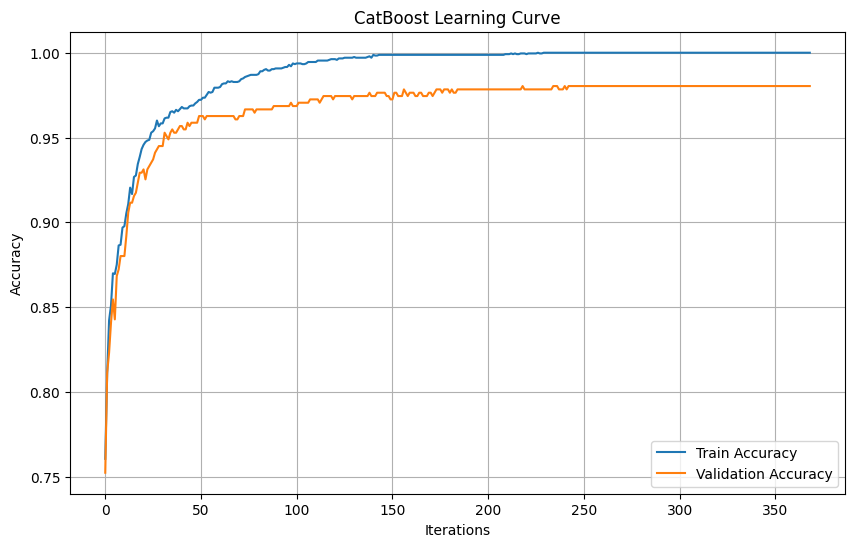

=== Fairness Matrix by Gender ===

Gender: Male
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 0.9756 | 0.0193 | 0.9091
    1 | 1.0000 | 0.0047 | 0.9722
    2 | 0.0000 | 0.0000 | 0.0000
    3 | 1.0000 | 0.0000 | 1.0000
    4 | 0.8974 | 0.0048 | 0.9722
    5 | 1.0000 | 0.0000 | 1.0000

Gender: Female
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 0.9773 | 0.0000 | 1.0000
    1 | 0.9800 | 0.0000 | 1.0000
    2 | 1.0000 | 0.0056 | 0.9882
    3 | 0.0000 | 0.0000 | 0.0000
    4 | 1.0000 | 0.0093 | 0.9583
    5 | 1.0000 | 0.0000 | 1.0000

=== Gender Disparity Summary ===
Class 0: TPR diff = 0.0017, Precision diff = 0.0909
Class 1: TPR diff = 0.0200, Precision diff = 0.0278
Class 2: TPR diff = 1.0000, Precision diff = 0.9882
 Significant disparity detected in Class 2
Class 3: TPR diff = 1.0000, Precision diff = 1.0000
 Significant disparity detected in Class 3
Class 4: TPR diff = 0.1026, Precision diff = 0.0139
 Significant dispa

In [20]:
# optimized CatBoost model with hyperparameters
opt_cat_model = CatBoostClassifier(
    iterations=3000,            
    learning_rate=0.10,        
    depth=6,                    
    l2_leaf_reg=3,              
    bagging_temperature=0.7,     
    eval_metric='Accuracy',
    random_seed=42,
    early_stopping_rounds=150,
    verbose=100
)


train_pool = Pool(X_train, y_train)
val_pool = Pool(X_val, y_val)

opt_cat_model.fit(train_pool, eval_set=val_pool, use_best_model=True)

y_pred = opt_cat_model.predict(X_test)
y_pred_probs = opt_cat_model.predict_proba(X_test)

train_acc = opt_cat_model.score(X_train, y_train)
val_acc = opt_cat_model.score(X_val, y_val)
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting)"
elif diff > 0.1:
    diagnosis = "High variance (overfitting)"
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit"
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting"
else:
    diagnosis = "Validation > Training, unusual case"

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference (train - val): {diff:.4f}")
print(f"Diagnosis: {diagnosis}")


accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

results = opt_cat_model.get_evals_result()
plt.figure(figsize=(10,6))
plt.plot(results['learn']['Accuracy'], label='Train Accuracy')
plt.plot(results['validation']['Accuracy'], label='Validation Accuracy')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.title('CatBoost Learning Curve')
plt.legend()
plt.grid(True)
plt.show()


def fairness_matrix_onehot_gender(y_true, y_pred_probs, X_test_df):
    gender_onehot = X_test_df[['gender_Female', 'gender_Male']].values
    gender = np.argmax(gender_onehot, axis=1)  # 0=Male, 1=Female
    y_true_idx = y_true
    y_pred_idx = np.argmax(y_pred_probs, axis=1)
    
    groups = np.unique(gender)
    classes = np.unique(y_true_idx)
    results = {g: {} for g in groups}
    
    for g in groups:
        idx = np.where(gender==g)
        y_true_g = y_true_idx[idx]
        y_pred_g = y_pred_idx[idx]
        for c in classes:
            TP = np.sum((y_pred_g==c) & (y_true_g==c))
            FN = np.sum((y_pred_g!=c) & (y_true_g==c))
            FP = np.sum((y_pred_g==c) & (y_true_g!=c))
            TN = np.sum((y_pred_g!=c) & (y_true_g!=c))
            TPR = TP / (TP+FN) if (TP+FN) > 0 else 0
            FPR = FP / (FP+TN) if (FP+TN) > 0 else 0
            Precision = TP / (TP+FP) if (TP+FP) > 0 else 0
            results[g][c] = {'TPR': TPR, 'FPR': FPR, 'Precision': Precision}
    
    print("=== Fairness Matrix by Gender ===")
    for g, class_metrics in results.items():
        gender_name = "Male" if g==0 else "Female"
        print(f"\nGender: {gender_name}")
        print("Class | TPR     | FPR     | Precision")
        print("-"*32)
        for c, metrics in class_metrics.items():
            print(f"{c:5d} | {metrics['TPR']:.4f} | {metrics['FPR']:.4f} | {metrics['Precision']:.4f}")
    
    return results

fairness_results = fairness_matrix_onehot_gender(y_test, y_pred_probs, X_test)

# Gender Disparity Summary
print("\n=== Gender Disparity Summary ===")
num_classes = y_test.max() + 1
for c in range(num_classes):
    tpr_diff = abs(fairness_results[0][c]['TPR'] - fairness_results[1][c]['TPR'])
    precision_diff = abs(fairness_results[0][c]['Precision'] - fairness_results[1][c]['Precision'])
    print(f"Class {c}: TPR diff = {tpr_diff:.4f}, Precision diff = {precision_diff:.4f}")
    if tpr_diff > 0.1 or precision_diff > 0.1:
        print(f" Significant disparity detected in Class {c}")


sensitivity = []
specificity = []

for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FN + FP)
    
    sens = TP / (TP + FN) if (TP + FN) > 0 else 0
    spec = TN / (TN + FP) if (TN + FP) > 0 else 0
    
    sensitivity.append(sens)
    specificity.append(spec)

for i in range(num_classes):
    print(f"Class {i}: Sensitivity = {sensitivity[i]:.4f}, Specificity = {specificity[i]:.4f}")

y_test_bin = label_binarize(y_test, classes=np.arange(num_classes))
auc = roc_auc_score(y_test_bin, y_pred_probs, average='macro', multi_class='ovr')
print(f"\nMacro-Average AUC: {auc:.4f}")


### 2.1. XGBoost with Label Encoder

[0]	validation_0-mlogloss:1.66515	validation_1-mlogloss:1.66810
[100]	validation_0-mlogloss:0.05414	validation_1-mlogloss:0.11460
[200]	validation_0-mlogloss:0.01227	validation_1-mlogloss:0.07184
[300]	validation_0-mlogloss:0.00677	validation_1-mlogloss:0.06703
[400]	validation_0-mlogloss:0.00505	validation_1-mlogloss:0.06518
[500]	validation_0-mlogloss:0.00424	validation_1-mlogloss:0.06460
[600]	validation_0-mlogloss:0.00374	validation_1-mlogloss:0.06444
[700]	validation_0-mlogloss:0.00341	validation_1-mlogloss:0.06496
[800]	validation_0-mlogloss:0.00317	validation_1-mlogloss:0.06506
[900]	validation_0-mlogloss:0.00299	validation_1-mlogloss:0.06524
[999]	validation_0-mlogloss:0.00285	validation_1-mlogloss:0.06538


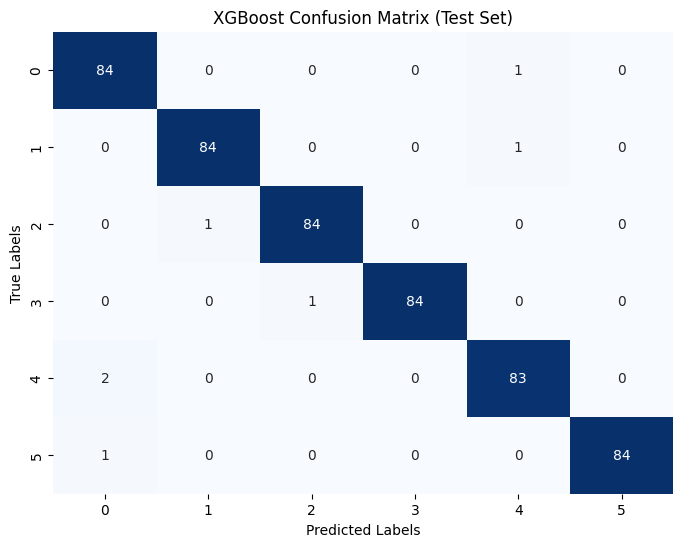

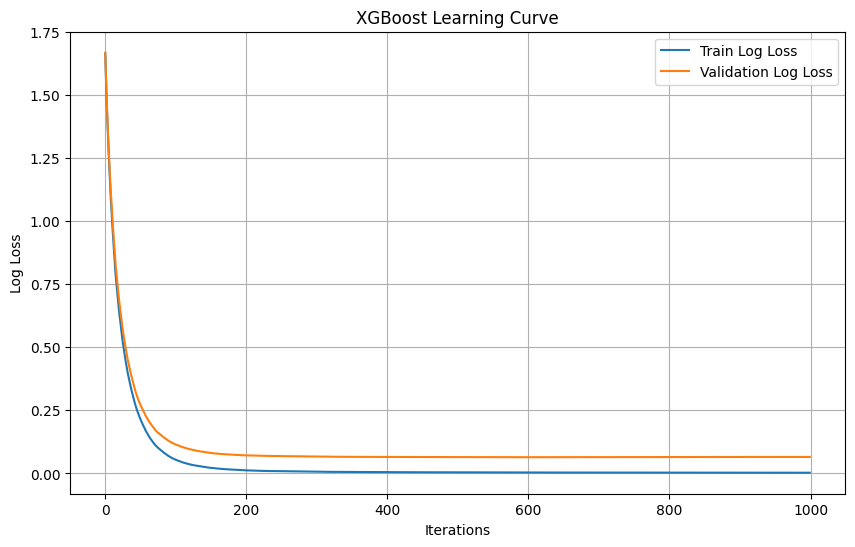

Train Accuracy: 1.0000
Validation Accuracy: 0.9764
Test Accuracy: 0.9863
Accuracy difference (train - val): 0.0236
Diagnosis: Good fit
=== Fairness Matrix by Gender ===

Gender: Male
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 1.0000 | 0.0097 | 0.9535
    1 | 0.9714 | 0.0047 | 0.9714
    2 | 0.0000 | 0.0000 | 0.0000
    3 | 1.0000 | 0.0000 | 1.0000
    4 | 0.9487 | 0.0048 | 0.9737
    5 | 1.0000 | 0.0000 | 1.0000

Gender: Female
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 0.9773 | 0.0046 | 0.9773
    1 | 1.0000 | 0.0000 | 1.0000
    2 | 1.0000 | 0.0056 | 0.9882
    3 | 0.0000 | 0.0000 | 0.0000
    4 | 1.0000 | 0.0046 | 0.9787
    5 | 0.9730 | 0.0000 | 1.0000

=== Gender Disparity Summary ===
Class 0: TPR diff = 0.0227, Precision diff = 0.0238
Class 1: TPR diff = 0.0286, Precision diff = 0.0286
Class 2: TPR diff = 1.0000, Precision diff = 0.9882
  ⚠️ Significant disparity detected in Class 2
Class 3: TPR diff = 1.0000

In [39]:

#  BUILDING XGBOOST MODEL
XGboost_model = XGBClassifier(
    objective='multi:softprob',
    num_class=len(np.unique(y)),
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric='mlogloss'
)

eval_set = [(X_train, y_train), (X_val, y_val)]
XGboost_model.fit(X_train, y_train, eval_set=eval_set, verbose=100)

# Predictions
y_pred_probs = XGboost_model.predict_proba(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

train_acc = accuracy_score(y_train, XGboost_model.predict(X_train))
val_acc = accuracy_score(y_val, XGboost_model.predict(X_val))
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

# Bias/Variance diagnosis
if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting)"
elif diff > 0.1:
    diagnosis = "High variance (overfitting)"
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit"
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting"
else:
    diagnosis = "Validation > Training, unusual case"


cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('XGBoost Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


results = XGboost_model.evals_result()
plt.figure(figsize=(10,6))
plt.plot(results['validation_0']['mlogloss'], label='Train Log Loss')
plt.plot(results['validation_1']['mlogloss'], label='Validation Log Loss')
plt.xlabel('Iterations')
plt.ylabel('Log Loss')
plt.title('XGBoost Learning Curve')
plt.legend()
plt.grid(True)
plt.show()


print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference (train - val): {diff:.4f}")
print(f"Diagnosis: {diagnosis}")


def fairness_matrix_onehot_gender(y_true, y_pred_probs, X_test_df):
    """ Computes TPR, FPR, Precision for gender_Female vs gender_Male """
    gender_onehot = X_test_df[['gender_Female', 'gender_Male']].values
    gender = np.argmax(gender_onehot, axis=1)  # 0=Male, 1=Female
    y_true_idx = y_true
    y_pred_idx = np.argmax(y_pred_probs, axis=1)

    groups = np.unique(gender)
    classes = np.unique(y_true_idx)
    results = {g: {} for g in groups}

    for g in groups:
        idx = np.where(gender == g)[0]
        y_true_g = y_true_idx[idx]
        y_pred_g = y_pred_idx[idx]
        for c in classes:
            TP = np.sum((y_pred_g == c) & (y_true_g == c))
            FN = np.sum((y_pred_g != c) & (y_true_g == c))
            FP = np.sum((y_pred_g == c) & (y_true_g != c))
            TN = np.sum((y_pred_g != c) & (y_true_g != c))
            TPR = TP / (TP+FN) if (TP+FN) > 0 else 0
            FPR = FP / (FP+TN) if (FP+TN) > 0 else 0
            Precision = TP / (TP+FP) if (TP+FP) > 0 else 0
            results[g][c] = {'TPR': TPR, 'FPR': FPR, 'Precision': Precision}

    print("=== Fairness Matrix by Gender ===")
    for g, class_metrics in results.items():
        gender_name = "Male" if g == 0 else "Female"
        print(f"\nGender: {gender_name}")
        print("Class | TPR     | FPR     | Precision")
        print("-"*32)
        for c, metrics in class_metrics.items():
            print(f"{c:5d} | {metrics['TPR']:.4f} | {metrics['FPR']:.4f} | {metrics['Precision']:.4f}")

    return results

# Compute fairness
fairness_results = fairness_matrix_onehot_gender(y_test, y_pred_probs, X_test)


print("\n=== Gender Disparity Summary ===")
num_classes = len(np.unique(y_test))
for c in range(num_classes):
    tpr_diff = abs(fairness_results[0][c]['TPR'] - fairness_results[1][c]['TPR'])
    precision_diff = abs(fairness_results[0][c]['Precision'] - fairness_results[1][c]['Precision'])
    print(f"Class {c}: TPR diff = {tpr_diff:.4f}, Precision diff = {precision_diff:.4f}")
    if tpr_diff > 0.1 or precision_diff > 0.1:
        print(f"  ⚠️ Significant disparity detected in Class {c}")


accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")


precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1-score (macro): {f1:.4f}")

 
num_classes=len(np.unique(y_test))
sensitivity = {}
specificity = {}

for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FP + FN)
    
    sensitivity[i] = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity[i] = TN / (TN + FP) if (TN + FP) > 0 else 0

print("\nSensitivity (TPR) per class:")
for i, val in sensitivity.items():
    print(f"Class {i}: {val:.4f}")

print("\nSpecificity (TNR) per class:")
for i, val in specificity.items():
    print(f"Class {i}: {val:.4f}")


try:
    auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr')
    print(f"\nAUC (One-vs-Rest): {auc:.4f}")
except:
    print("\nAUC could not be calculated for this multiclass problem.")


### 2.3. Random Forest

20-Fold CV Accuracy: Mean = 0.9356, Std = 0.0265
Train Accuracy: 0.9630
Validation Accuracy: 0.9450
Test Accuracy: 0.9569
Accuracy difference (train - val): 0.0180
Diagnosis: Good fit


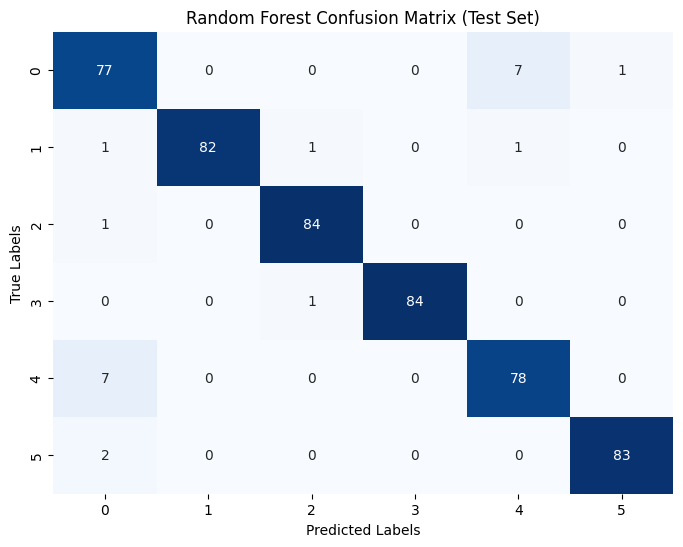

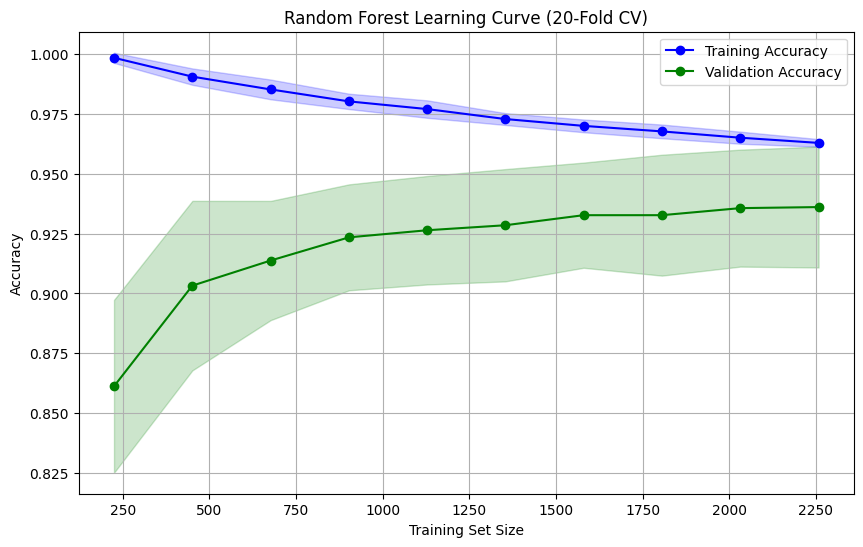

Precision (macro): 0.9578
Recall (macro): 0.9569
F1-score (macro): 0.9572

Sensitivity (TPR) per class:
Class 0: 0.9059
Class 1: 0.9647
Class 2: 0.9882
Class 3: 0.9882
Class 4: 0.9176
Class 5: 0.9765

Specificity (TNR) per class:
Class 0: 0.9741
Class 1: 1.0000
Class 2: 0.9953
Class 3: 1.0000
Class 4: 0.9812
Class 5: 0.9976

AUC (One-vs-Rest): 0.9930


In [23]:

rf_model = RandomForestClassifier(
    n_estimators=1000,
    max_depth=6,
    random_state=42,
    class_weight='balanced',
    n_jobs=-1
)

cv_scores = cross_val_score(rf_model, X_train, y_train, cv=20, scoring='accuracy', n_jobs=-1)
print(f"20-Fold CV Accuracy: Mean = {cv_scores.mean():.4f}, Std = {cv_scores.std():.4f}")

rf_model.fit(X_train, y_train)


y_pred = rf_model.predict(X_test)
y_pred_probs = rf_model.predict_proba(X_test)

train_acc = rf_model.score(X_train, y_train)
val_acc = rf_model.score(X_val, y_val)
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting)"
elif diff > 0.1:
    diagnosis = "High variance (overfitting)"
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit"
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting"
else:
    diagnosis = "Good fit"

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference (train - val): {diff:.4f}")
print(f"Diagnosis: {diagnosis}")

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Random Forest Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

train_sizes, train_scores, val_scores = learning_curve(
    estimator=rf_model,
    X=X_train,
    y=y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=20,             
    scoring='accuracy',
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
val_mean = np.mean(val_scores, axis=1)
val_std = np.std(val_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Training Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.plot(train_sizes, val_mean, 'o-', color='green', label='Validation Accuracy')
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.2, color='green')
plt.title('Random Forest Learning Curve (20-Fold CV)')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.grid(True)
plt.show()


precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1-score (macro): {f1:.4f}")

num_classes = len(np.unique(y_test))
sensitivity = {}
specificity = {}

for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FP + FN)
    
    sensitivity[i] = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity[i] = TN / (TN + FP) if (TN + FP) > 0 else 0

print("\nSensitivity (TPR) per class:")
for i, val in sensitivity.items():
    print(f"Class {i}: {val:.4f}")

print("\nSpecificity (TNR) per class:")
for i, val in specificity.items():
    print(f"Class {i}: {val:.4f}")


try:
    auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr')
    print(f"\nAUC (One-vs-Rest): {auc:.4f}")
except:
    print("\nAUC could not be calculated for this multiclass problem.")



### 2.4 Logistic Regresion + PCA

Train Accuracy: 0.9508
Validation Accuracy: 0.9528
Test Accuracy: 0.9431
Accuracy difference (train - val): -0.0021
Diagnosis: Good fit


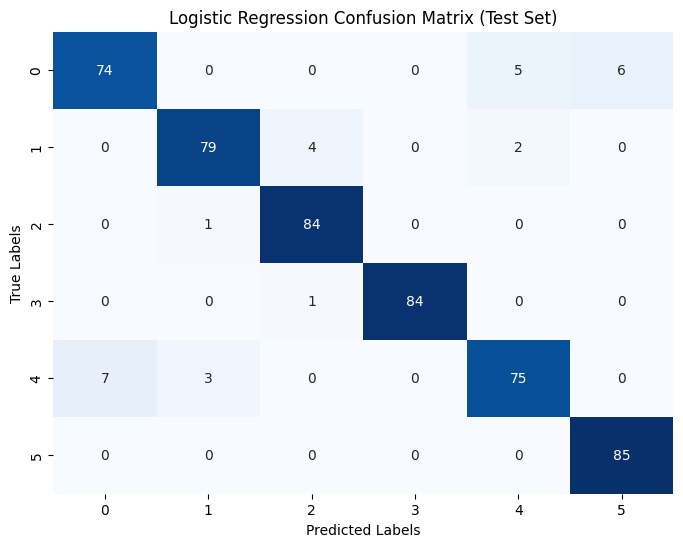

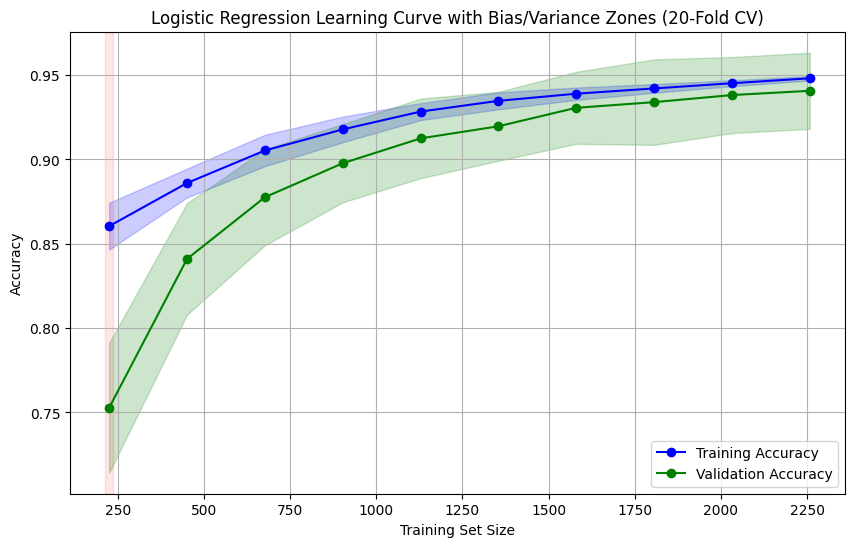

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.87      0.89        85
           1       0.95      0.93      0.94        85
           2       0.94      0.99      0.97        85
           3       1.00      0.99      0.99        85
           4       0.91      0.88      0.90        85
           5       0.93      1.00      0.97        85

    accuracy                           0.94       510
   macro avg       0.94      0.94      0.94       510
weighted avg       0.94      0.94      0.94       510

Precision (macro): 0.9430
Recall (macro): 0.9431
F1-score (macro): 0.9426

Sensitivity (TPR) per class:
Class 0: 0.8706
Class 1: 0.9294
Class 2: 0.9882
Class 3: 0.9882
Class 4: 0.8824
Class 5: 1.0000

Specificity (TNR) per class:
Class 0: 0.9835
Class 1: 0.9906
Class 2: 0.9882
Class 3: 1.0000
Class 4: 0.9835
Class 5: 0.9859

AUC (One-vs-Rest): 0.9942


In [24]:


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)


lr_model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42)
lr_model.fit(X_train_scaled, y_train)

y_pred = lr_model.predict(X_test_scaled)
y_pred_probs = lr_model.predict_proba(X_test_scaled)

train_acc = lr_model.score(X_train_scaled, y_train)
val_acc = lr_model.score(X_val_scaled, y_val)
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting)"
elif diff > 0.1:
    diagnosis = "High variance (overfitting)"
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit"
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting"
else:
    diagnosis = "Good fit"

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference (train - val): {diff:.4f}")
print(f"Diagnosis: {diagnosis}")


cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Logistic Regression Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()
from sklearn.model_selection import learning_curve


train_sizes, train_scores, val_scores = learning_curve(
    estimator=lr_model,
    X=X_train_scaled,
    y=y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=20,
    scoring='accuracy',
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

# Compute mean and std
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
val_mean = np.mean(val_scores, axis=1)
val_std = np.std(val_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Training Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.plot(train_sizes, val_mean, 'o-', color='green', label='Validation Accuracy')
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.2, color='green')

# Highlight zones
for i, size in enumerate(train_sizes):
    gap = train_mean[i] - val_mean[i]
    if gap > 0.05:
        plt.axvspan(size-0.05*size, size+0.05*size, color='red', alpha=0.1)  # overfitting
    elif val_mean[i] < 0.7 and train_mean[i] < 0.7:
        plt.axvspan(size-0.05*size, size+0.05*size, color='yellow', alpha=0.1)  # underfitting

plt.title('Logistic Regression Learning Curve with Bias/Variance Zones (20-Fold CV)')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.grid(True)
plt.show()


print("Classification Report:")
print(classification_report(y_test, y_pred))


precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1-score (macro): {f1:.4f}")


num_classes = len(np.unique(y_test))
sensitivity = {}
specificity = {}

for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FP + FN)
    
    sensitivity[i] = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity[i] = TN / (TN + FP) if (TN + FP) > 0 else 0

print("\nSensitivity (TPR) per class:")
for i, val in sensitivity.items():
    print(f"Class {i}: {val:.4f}")

print("\nSpecificity (TNR) per class:")
for i, val in specificity.items():
    print(f"Class {i}: {val:.4f}")


try:
    auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr')
    print(f"\nAUC (One-vs-Rest): {auc:.4f}")
except:
    print("\nAUC could not be calculated for this multiclass problem.")


### 2.5. LSTM with one hot encoder

Epoch 1/150
75/75 - 5s - 60ms/step - accuracy: 0.2840 - loss: 1.6781 - val_accuracy: 0.4204 - val_loss: 1.4084
Epoch 2/150
75/75 - 0s - 4ms/step - accuracy: 0.4552 - loss: 1.2843 - val_accuracy: 0.5305 - val_loss: 1.0794
Epoch 3/150
75/75 - 0s - 3ms/step - accuracy: 0.5423 - loss: 1.0582 - val_accuracy: 0.6306 - val_loss: 0.9188
Epoch 4/150
75/75 - 0s - 3ms/step - accuracy: 0.6260 - loss: 0.9204 - val_accuracy: 0.7446 - val_loss: 0.7791
Epoch 5/150
75/75 - 0s - 2ms/step - accuracy: 0.7089 - loss: 0.7997 - val_accuracy: 0.8035 - val_loss: 0.6418
Epoch 6/150
75/75 - 0s - 3ms/step - accuracy: 0.7446 - loss: 0.6803 - val_accuracy: 0.8487 - val_loss: 0.5394
Epoch 7/150
75/75 - 0s - 2ms/step - accuracy: 0.7610 - loss: 0.6154 - val_accuracy: 0.8271 - val_loss: 0.4956
Epoch 8/150
75/75 - 0s - 2ms/step - accuracy: 0.7753 - loss: 0.5751 - val_accuracy: 0.8389 - val_loss: 0.4548
Epoch 9/150
75/75 - 0s - 2ms/step - accuracy: 0.7875 - loss: 0.5271 - val_accuracy: 0.8428 - val_loss: 0.4489
Epoch 10/

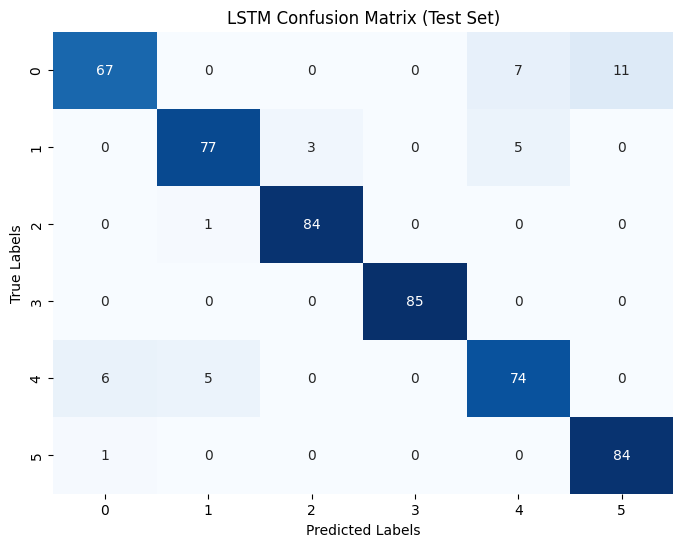

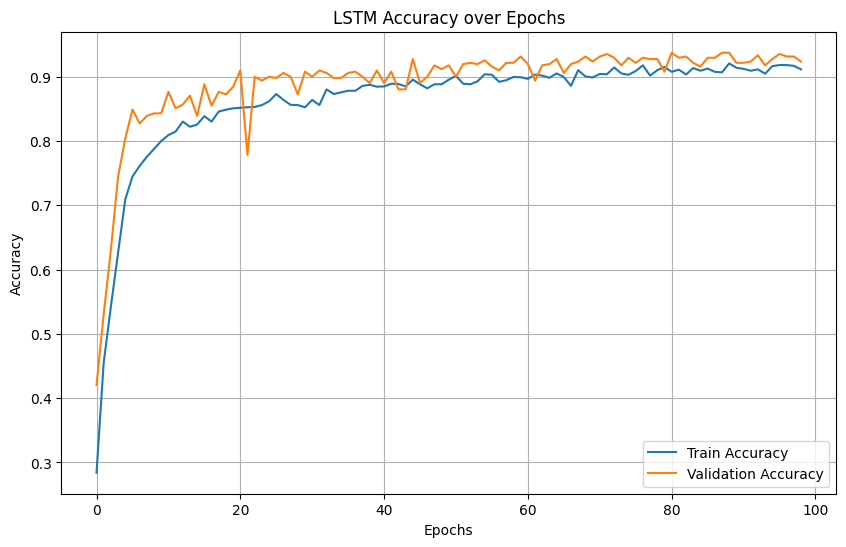

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.79      0.84        85
           1       0.93      0.91      0.92        85
           2       0.97      0.99      0.98        85
           3       1.00      1.00      1.00        85
           4       0.86      0.87      0.87        85
           5       0.88      0.99      0.93        85

    accuracy                           0.92       510
   macro avg       0.92      0.92      0.92       510
weighted avg       0.92      0.92      0.92       510

Precision (macro): 0.9239
Recall (macro): 0.9235
F1-score (macro): 0.9225

Sensitivity (TPR) per class:
Class 0: 0.7882
Class 1: 0.9059
Class 2: 0.9882
Class 3: 1.0000
Class 4: 0.8706
Class 5: 0.9882

Specificity (TNR) per class:
Class 0: 0.9835
Class 1: 0.9859
Class 2: 0.9929
Class 3: 1.0000
Class 4: 0.9718
Class 5: 0.9741

AUC (One-vs-Rest): 0.9933


In [25]:

X_train_lstm = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_val_lstm = X_val.values.reshape((X_val.shape[0], 1, X_val.shape[1]))
X_test_lstm = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

num_classes = len(np.unique(y))
lstm_model = Sequential([
    LSTM(64, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=False),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Use sparse_categorical_crossentropy for integer labels
lstm_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = lstm_model.fit(
    X_train_lstm, y_train,
    validation_data=(X_val_lstm, y_val),
    epochs=150,
    batch_size=32,
    callbacks=[early_stop],
    verbose=2
)

y_pred_probs = lstm_model.predict(X_test_lstm)
y_pred = np.argmax(y_pred_probs, axis=1)

train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting) – model not learning well."
elif diff > 0.1:
    diagnosis = "High variance (overfitting) – memorizing training data."
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit – generalizes well."
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting – minor gap."
else:
    diagnosis = "Validation accuracy higher than training – check randomness/dropout."

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference: {diff:.4f}")
print(f"Diagnosis: {diagnosis}")

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('LSTM Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


plt.figure(figsize=(10,6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('LSTM Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

print("Classification Report:")
print(classification_report(y_test, y_pred))

precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1-score (macro): {f1:.4f}")


sensitivity = {}
specificity = {}
for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FP + FN)
    
    sensitivity[i] = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity[i] = TN / (TN + FP) if (TN + FP) > 0 else 0

print("\nSensitivity (TPR) per class:")
for i, val in sensitivity.items():
    print(f"Class {i}: {val:.4f}")
print("\nSpecificity (TNR) per class:")
for i, val in specificity.items():
    print(f"Class {i}: {val:.4f}")


try:
    
    from tensorflow.keras.utils import to_categorical
    y_test_onehot = to_categorical(y_test, num_classes=num_classes)
    auc = roc_auc_score(y_test_onehot, y_pred_probs, multi_class='ovr')
    print(f"\nAUC (One-vs-Rest): {auc:.4f}")
except:
    print("\nAUC could not be calculated for this multiclass problem.")


Epoch 1/200
149/149 - 5s - 32ms/step - accuracy: 0.4026 - loss: 1.3573 - val_accuracy: 0.6444 - val_loss: 0.8745
Epoch 2/200
149/149 - 0s - 3ms/step - accuracy: 0.6735 - loss: 0.7603 - val_accuracy: 0.8153 - val_loss: 0.5178
Epoch 3/200
149/149 - 0s - 3ms/step - accuracy: 0.7812 - loss: 0.5343 - val_accuracy: 0.8291 - val_loss: 0.4352
Epoch 4/200
149/149 - 1s - 3ms/step - accuracy: 0.8035 - loss: 0.4705 - val_accuracy: 0.8468 - val_loss: 0.3764
Epoch 5/200
149/149 - 1s - 4ms/step - accuracy: 0.8212 - loss: 0.4303 - val_accuracy: 0.7505 - val_loss: 0.5336
Epoch 6/200
149/149 - 1s - 4ms/step - accuracy: 0.8271 - loss: 0.4082 - val_accuracy: 0.8546 - val_loss: 0.3308
Epoch 7/200
149/149 - 1s - 4ms/step - accuracy: 0.8498 - loss: 0.3870 - val_accuracy: 0.8330 - val_loss: 0.3895
Epoch 8/200
149/149 - 1s - 4ms/step - accuracy: 0.8355 - loss: 0.3953 - val_accuracy: 0.8389 - val_loss: 0.3845
Epoch 9/200
149/149 - 1s - 4ms/step - accuracy: 0.8414 - loss: 0.3717 - val_accuracy: 0.8271 - val_loss

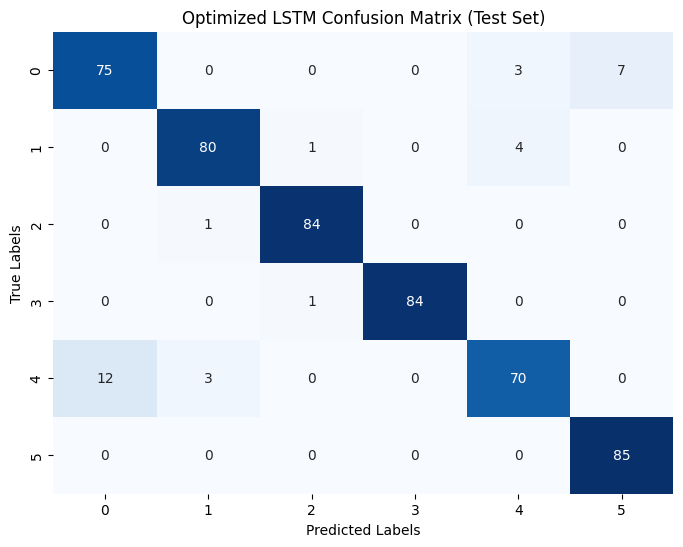

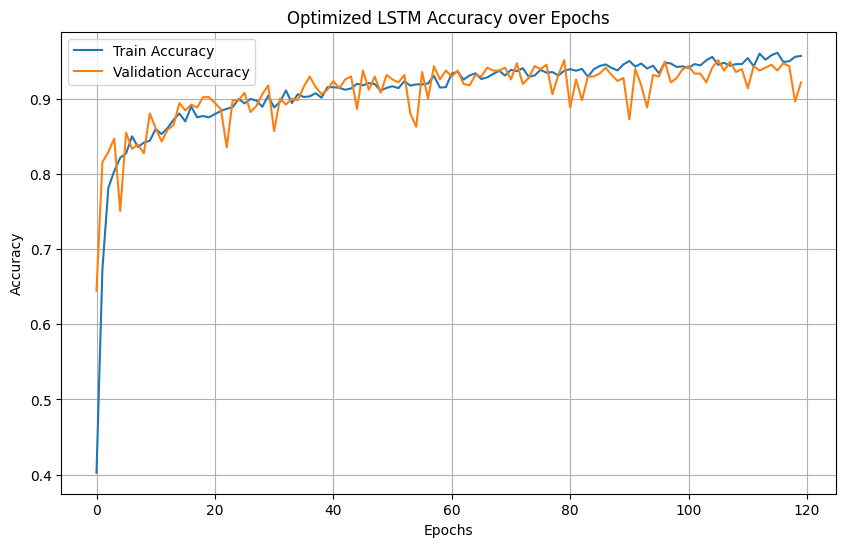

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.88      0.87        85
           1       0.95      0.94      0.95        85
           2       0.98      0.99      0.98        85
           3       1.00      0.99      0.99        85
           4       0.91      0.82      0.86        85
           5       0.92      1.00      0.96        85

    accuracy                           0.94       510
   macro avg       0.94      0.94      0.94       510
weighted avg       0.94      0.94      0.94       510

Precision (macro): 0.9374
Recall (macro): 0.9373
F1-score (macro): 0.9367

Sensitivity (TPR) per class:
Class 0: 0.8824
Class 1: 0.9412
Class 2: 0.9882
Class 3: 0.9882
Class 4: 0.8235
Class 5: 1.0000

Specificity (TNR) per class:
Class 0: 0.9718
Class 1: 0.9906
Class 2: 0.9953
Class 3: 1.0000
Class 4: 0.9835
Class 5: 0.9835

AUC (One-vs-Rest): 0.9945


In [26]:

classes = np.unique(y_train)
class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights_dict = dict(zip(classes, class_weights))

X_train_lstm = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_val_lstm = X_val.values.reshape((X_val.shape[0], 1, X_val.shape[1]))
X_test_lstm = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))


num_classes = len(classes)
opt_lstm_model = Sequential([
    LSTM(128, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]),
         return_sequences=True, recurrent_dropout=0.2),
    LSTM(64, return_sequences=False, recurrent_dropout=0.2),
    Dropout(0.4),
    Dense(32, activation='relu'),
    Dense(num_classes, activation='softmax')
])

opt_lstm_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)


history = opt_lstm_model.fit(
    X_train_lstm, y_train,
    validation_data=(X_val_lstm, y_val),
    epochs=200,
    batch_size=16,
    callbacks=[early_stop],
    class_weight=class_weights_dict,
    verbose=2
)


y_pred_probs = opt_lstm_model.predict(X_test_lstm)
y_pred = np.argmax(y_pred_probs, axis=1)

train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting) – model not learning well."
elif diff > 0.1:
    diagnosis = "High variance (overfitting) – memorizing training data."
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit – generalizes well."
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting – minor gap."
else:
    diagnosis = "Validation accuracy higher than training – check randomness/dropout."

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference: {diff:.4f}")
print(f"Diagnosis: {diagnosis}")

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Optimized LSTM Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

plt.figure(figsize=(10,6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Optimized LSTM Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


print("Classification Report:")
print(classification_report(y_test, y_pred))

precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1-score (macro): {f1:.4f}")

sensitivity = {}
specificity = {}
for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FP + FN)
    
    sensitivity[i] = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity[i] = TN / (TN + FP) if (TN + FP) > 0 else 0

print("\nSensitivity (TPR) per class:")
for i, val in sensitivity.items():
    print(f"Class {i}: {val:.4f}")
print("\nSpecificity (TNR) per class:")
for i, val in specificity.items():
    print(f"Class {i}: {val:.4f}")


try:
    from tensorflow.keras.utils import to_categorical
    y_test_onehot = to_categorical(y_test, num_classes=num_classes)
    auc = roc_auc_score(y_test_onehot, y_pred_probs, multi_class='ovr')
    print(f"\nAUC (One-vs-Rest): {auc:.4f}")
except:
    print("\nAUC could not be calculated for this multiclass problem.")


## 2.6 ANN-PSO

Epoch 1/150
75/75 - 1s - 13ms/step - accuracy: 0.1914 - loss: 9.9198 - val_accuracy: 0.2574 - val_loss: 2.1589
Epoch 2/150
75/75 - 0s - 2ms/step - accuracy: 0.2469 - loss: 3.7176 - val_accuracy: 0.3006 - val_loss: 1.7804
Epoch 3/150
75/75 - 0s - 2ms/step - accuracy: 0.2852 - loss: 2.6368 - val_accuracy: 0.4244 - val_loss: 1.3955
Epoch 4/150
75/75 - 0s - 2ms/step - accuracy: 0.3143 - loss: 1.9955 - val_accuracy: 0.4617 - val_loss: 1.3430
Epoch 5/150
75/75 - 0s - 2ms/step - accuracy: 0.3382 - loss: 1.7120 - val_accuracy: 0.4578 - val_loss: 1.2142
Epoch 6/150
75/75 - 0s - 2ms/step - accuracy: 0.3841 - loss: 1.4834 - val_accuracy: 0.4990 - val_loss: 1.1215
Epoch 7/150
75/75 - 0s - 2ms/step - accuracy: 0.4316 - loss: 1.3344 - val_accuracy: 0.5599 - val_loss: 1.0479
Epoch 8/150
75/75 - 0s - 2ms/step - accuracy: 0.4657 - loss: 1.2524 - val_accuracy: 0.5619 - val_loss: 1.0482
Epoch 9/150
75/75 - 0s - 2ms/step - accuracy: 0.4859 - loss: 1.1957 - val_accuracy: 0.6424 - val_loss: 0.9573
Epoch 10/

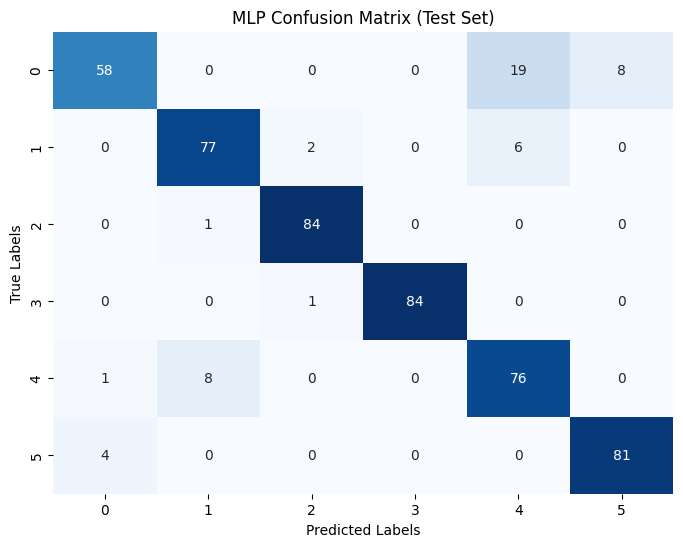

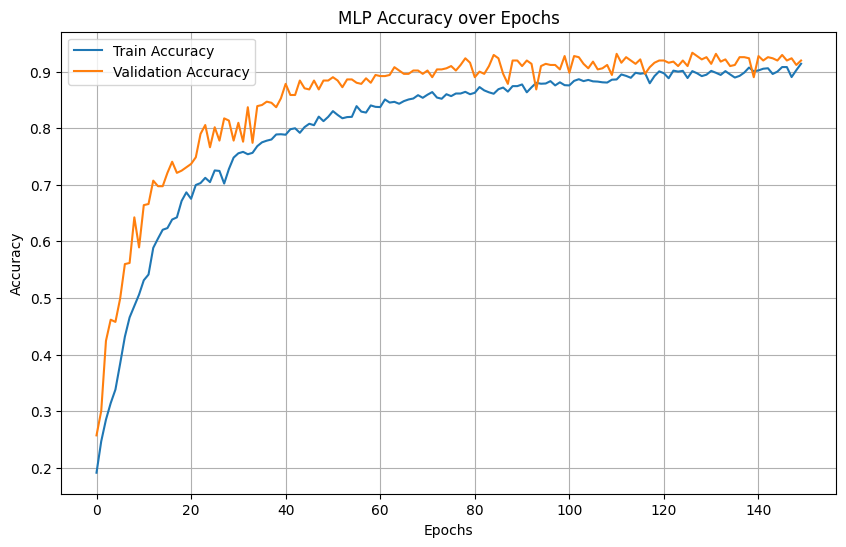

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.68      0.78        85
           1       0.90      0.91      0.90        85
           2       0.97      0.99      0.98        85
           3       1.00      0.99      0.99        85
           4       0.75      0.89      0.82        85
           5       0.91      0.95      0.93        85

    accuracy                           0.90       510
   macro avg       0.91      0.90      0.90       510
weighted avg       0.91      0.90      0.90       510

Precision (macro): 0.9073
Recall (macro): 0.9020
F1-score (macro): 0.9006

Sensitivity (TPR) per class:
Class 0: 0.6824
Class 1: 0.9059
Class 2: 0.9882
Class 3: 0.9882
Class 4: 0.8941
Class 5: 0.9529

Specificity (TNR) per class:
Class 0: 0.9882
Class 1: 0.9788
Class 2: 0.9929
Class 3: 1.0000
Class 4: 0.9412
Class 5: 0.9812

AUC (One-vs-Rest): 0.9907


In [27]:

num_classes = len(np.unique(y))
mlp_model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(num_classes, activation='softmax')
])

mlp_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = mlp_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=32,
    callbacks=[early_stop],
    verbose=2
)

y_pred_probs = mlp_model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting) – model not learning well."
elif diff > 0.1:
    diagnosis = "High variance (overfitting) – memorizing training data."
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit – generalizes well."
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting – minor gap."
else:
    diagnosis = "Validation accuracy higher than training – check randomness/dropout."

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference: {diff:.4f}")
print(f"Diagnosis: {diagnosis}")


cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('MLP Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

plt.figure(figsize=(10,6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('MLP Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

print("Classification Report:")
print(classification_report(y_test, y_pred))

precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1-score (macro): {f1:.4f}")


sensitivity = {}
specificity = {}
for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FP + FN)
    
    sensitivity[i] = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity[i] = TN / (TN + FP) if (TN + FP) > 0 else 0

print("\nSensitivity (TPR) per class:")
for i, val in sensitivity.items():
    print(f"Class {i}: {val:.4f}")
print("\nSpecificity (TNR) per class:")
for i, val in specificity.items():
    print(f"Class {i}: {val:.4f}")


try:
    from tensorflow.keras.utils import to_categorical
    y_test_onehot = to_categorical(y_test, num_classes=num_classes)
    auc = roc_auc_score(y_test_onehot, y_pred_probs, multi_class='ovr')
    print(f"\nAUC (One-vs-Rest): {auc:.4f}")
except:
    print("\nAUC could not be calculated for this multiclass problem.")


Epoch 1/200
149/149 - 2s - 10ms/step - accuracy: 0.2045 - loss: 2.2756 - val_accuracy: 0.2161 - val_loss: 1.6456 - learning_rate: 1.0000e-03
Epoch 2/200
149/149 - 0s - 2ms/step - accuracy: 0.2617 - loss: 1.6811 - val_accuracy: 0.2417 - val_loss: 1.5429 - learning_rate: 1.0000e-03
Epoch 3/200
149/149 - 0s - 2ms/step - accuracy: 0.3555 - loss: 1.4631 - val_accuracy: 0.4872 - val_loss: 1.1928 - learning_rate: 1.0000e-03
Epoch 4/200
149/149 - 0s - 2ms/step - accuracy: 0.4417 - loss: 1.2163 - val_accuracy: 0.5835 - val_loss: 0.9870 - learning_rate: 1.0000e-03
Epoch 5/200
149/149 - 0s - 2ms/step - accuracy: 0.5120 - loss: 1.0642 - val_accuracy: 0.6464 - val_loss: 0.8616 - learning_rate: 1.0000e-03
Epoch 6/200
149/149 - 0s - 2ms/step - accuracy: 0.5595 - loss: 0.9771 - val_accuracy: 0.6621 - val_loss: 0.8094 - learning_rate: 1.0000e-03
Epoch 7/200
149/149 - 0s - 2ms/step - accuracy: 0.6041 - loss: 0.8889 - val_accuracy: 0.7269 - val_loss: 0.7023 - learning_rate: 1.0000e-03
Epoch 8/200
149/149

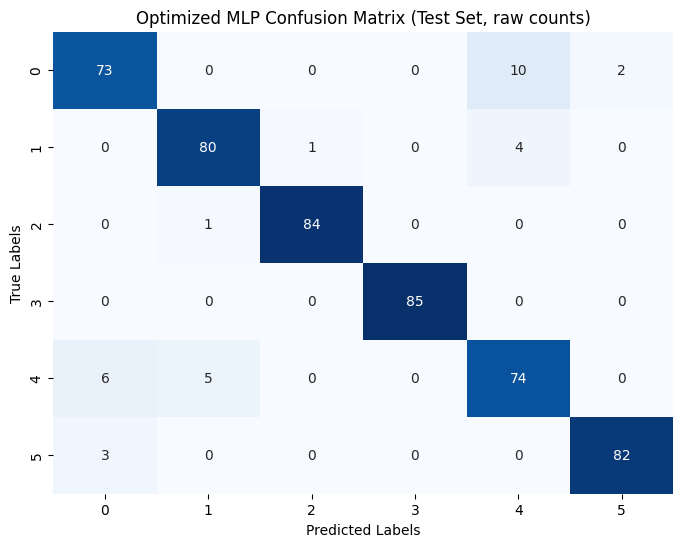

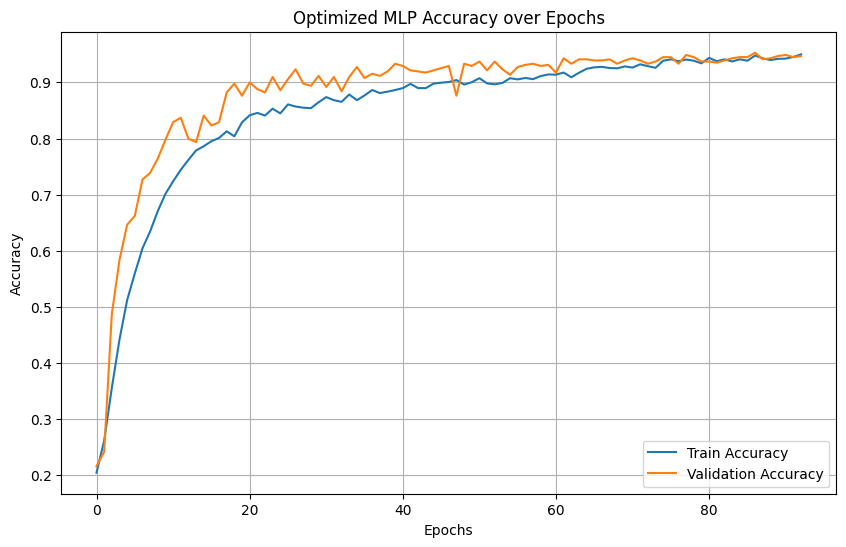

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.86      0.87        85
           1       0.93      0.94      0.94        85
           2       0.99      0.99      0.99        85
           3       1.00      1.00      1.00        85
           4       0.84      0.87      0.86        85
           5       0.98      0.96      0.97        85

    accuracy                           0.94       510
   macro avg       0.94      0.94      0.94       510
weighted avg       0.94      0.94      0.94       510

Precision (macro): 0.9376
Recall (macro): 0.9373
F1-score (macro): 0.9373

Sensitivity (TPR) per class:
Class 0: 0.8588
Class 1: 0.9412
Class 2: 0.9882
Class 3: 1.0000
Class 4: 0.8706
Class 5: 0.9647

Specificity (TNR) per class:
Class 0: 0.9788
Class 1: 0.9859
Class 2: 0.9976
Class 3: 1.0000
Class 4: 0.9671
Class 5: 0.9953

AUC (One-vs-Rest): 0.9945


In [28]:


num_classes = len(np.unique(y_train))

class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights_dict = dict(enumerate(class_weights))

opt_mlp_model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.15), 
    Dense(64, activation='relu'),
    Dropout(0.15),
    Dense(32, activation='relu'),
    Dense(num_classes, activation='softmax')
])

opt_mlp_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)


early_stop = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5, verbose=1)


history = opt_mlp_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=200,
    batch_size=16,
    callbacks=[early_stop, reduce_lr],
    class_weight=class_weights_dict,
    verbose=2
)

y_pred_probs = opt_mlp_model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting) – model not learning well."
elif diff > 0.1:
    diagnosis = "High variance (overfitting) – memorizing training data."
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit – generalizes well."
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting – minor gap."
else:
    diagnosis = "Validation accuracy higher than training – check randomness/dropout."

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference: {diff:.4f}")
print(f"Diagnosis: {diagnosis}")


cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Optimized MLP Confusion Matrix (Test Set, raw counts)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


plt.figure(figsize=(10,6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Optimized MLP Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

print("Classification Report:")
print(classification_report(y_test, y_pred))

precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1-score (macro): {f1:.4f}")


sensitivity = {}
specificity = {}
for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FP + FN)
    
    sensitivity[i] = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity[i] = TN / (TN + FP) if (TN + FP) > 0 else 0

print("\nSensitivity (TPR) per class:")
for i, val in sensitivity.items():
    print(f"Class {i}: {val:.4f}")
print("\nSpecificity (TNR) per class:")
for i, val in specificity.items():
    print(f"Class {i}: {val:.4f}")


try:
    y_test_onehot = to_categorical(y_test, num_classes=num_classes)
    auc = roc_auc_score(y_test_onehot, y_pred_probs, multi_class='ovr')
    print(f"\nAUC (One-vs-Rest): {auc:.4f}")
except:
    print("\nAUC could not be calculated for this multiclass problem.")


### 3. Ensemble techniques

Train Accuracy: 1.0000
Validation Accuracy: 0.9804
Test Accuracy: 0.9863
Accuracy difference (train - val): 0.0196
Diagnosis: Good fit
Accuracy : 0.9863
Precision: 0.9864
Recall   : 0.9863
F1 Score : 0.9863


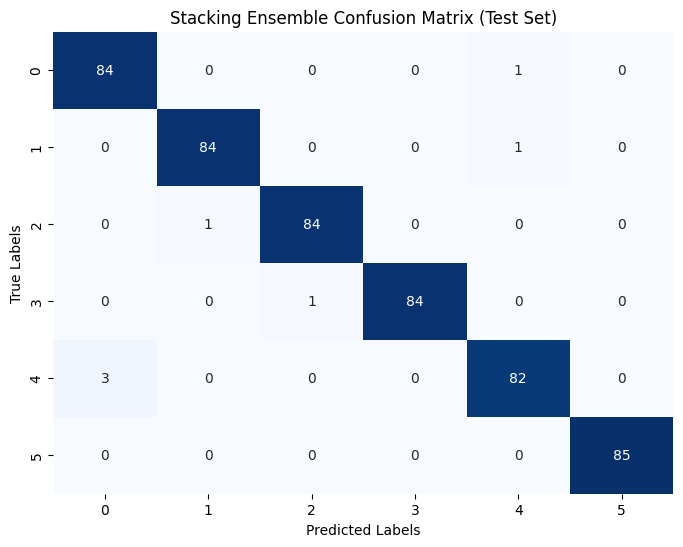

Class 0: Sensitivity = 0.9882, Specificity = 0.9929
Class 1: Sensitivity = 0.9882, Specificity = 0.9976
Class 2: Sensitivity = 0.9882, Specificity = 0.9976
Class 3: Sensitivity = 0.9882, Specificity = 1.0000
Class 4: Sensitivity = 0.9647, Specificity = 0.9953
Class 5: Sensitivity = 1.0000, Specificity = 1.0000

Macro-Average AUC: 0.9996
=== Fairness Matrix by Gender ===

Gender: Male
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 1.0000 | 0.0145 | 0.9318
    1 | 1.0000 | 0.0047 | 0.9722
    2 | 0.0000 | 0.0000 | 0.0000
    3 | 1.0000 | 0.0000 | 1.0000
    4 | 0.9231 | 0.0000 | 1.0000
    5 | 1.0000 | 0.0000 | 1.0000

Gender: Female
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 0.9773 | 0.0000 | 1.0000
    1 | 0.9800 | 0.0000 | 1.0000
    2 | 1.0000 | 0.0056 | 0.9882
    3 | 0.0000 | 0.0000 | 0.0000
    4 | 1.0000 | 0.0093 | 0.9583
    5 | 1.0000 | 0.0000 | 1.0000

=== Gender Disparity Summary ===
Class 0: TPR diff = 0.022

In [29]:

stack_model = StackingClassifier(
    estimators=[
        ('rf', rf_model),
        ('xgb', XGboost_model),
        ('cat', opt_cat_model)
    ],
    final_estimator=rf_model, 
    cv=5,
    n_jobs=-1,
    passthrough=True
)


stack_model.fit(X_train, y_train)


y_pred = stack_model.predict(X_test)


try:
    y_pred_probs = stack_model.predict_proba(X_test)
except:
    y_pred_probs = None


train_acc = stack_model.score(X_train, y_train)
val_acc = stack_model.score(X_val, y_val)
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting)"
elif diff > 0.1:
    diagnosis = "High variance (overfitting)"
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit"
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting"
else:
    diagnosis = "Validation > Training, unusual case"

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference (train - val): {diff:.4f}")
print(f"Diagnosis: {diagnosis}")


precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy : {test_acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")


cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Stacking Ensemble Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


num_classes = len(np.unique(y_test))
sensitivity = []
specificity = []

for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FN + FP)
    
    sens = TP / (TP + FN) if (TP + FN) > 0 else 0
    spec = TN / (TN + FP) if (TN + FP) > 0 else 0
    
    sensitivity.append(sens)
    specificity.append(spec)

for i in range(num_classes):
    print(f"Class {i}: Sensitivity = {sensitivity[i]:.4f}, Specificity = {specificity[i]:.4f}")


if y_pred_probs is not None:
    y_test_bin = label_binarize(y_test, classes=np.arange(num_classes))
    auc = roc_auc_score(y_test_bin, y_pred_probs, average='macro', multi_class='ovr')
    print(f"\nMacro-Average AUC: {auc:.4f}")


def fairness_matrix_onehot_gender(y_true, y_pred_probs, X_test_df):
    gender_onehot = X_test_df[['gender_Female', 'gender_Male']].values
    gender = np.argmax(gender_onehot, axis=1)  # 0=Male, 1=Female
    y_true_idx = y_true
    y_pred_idx = np.argmax(y_pred_probs, axis=1)
    
    groups = np.unique(gender)
    classes = np.unique(y_true_idx)
    results = {g: {} for g in groups}
    
    for g in groups:
        idx = np.where(gender==g)
        y_true_g = y_true_idx[idx]
        y_pred_g = y_pred_idx[idx]
        for c in classes:
            TP = np.sum((y_pred_g==c) & (y_true_g==c))
            FN = np.sum((y_pred_g!=c) & (y_true_g==c))
            FP = np.sum((y_pred_g==c) & (y_true_g!=c))
            TN = np.sum((y_pred_g!=c) & (y_true_g!=c))
            TPR = TP / (TP+FN) if (TP+FN) > 0 else 0
            FPR = FP / (FP+TN) if (FP+TN) > 0 else 0
            Precision = TP / (TP+FP) if (TP+FP) > 0 else 0
            results[g][c] = {'TPR': TPR, 'FPR': FPR, 'Precision': Precision}
    
    print("=== Fairness Matrix by Gender ===")
    for g, class_metrics in results.items():
        gender_name = "Male" if g==0 else "Female"
        print(f"\nGender: {gender_name}")
        print("Class | TPR     | FPR     | Precision")
        print("-"*32)
        for c, metrics in class_metrics.items():
            print(f"{c:5d} | {metrics['TPR']:.4f} | {metrics['FPR']:.4f} | {metrics['Precision']:.4f}")
    
    return results

if y_pred_probs is not None:
    fairness_results = fairness_matrix_onehot_gender(y_test, y_pred_probs, X_test)

    
    print("\n=== Gender Disparity Summary ===")
    for c in range(num_classes):
        tpr_diff = abs(fairness_results[0][c]['TPR'] - fairness_results[1][c]['TPR'])
        precision_diff = abs(fairness_results[0][c]['Precision'] - fairness_results[1][c]['Precision'])
        print(f"Class {c}: TPR diff = {tpr_diff:.4f}, Precision diff = {precision_diff:.4f}")
        if tpr_diff > 0.1 or precision_diff > 0.1:
            print(f" Significant disparity detected in Class {c}")


Train Accuracy: 1.0000
Validation Accuracy: 0.9804
Test Accuracy: 0.9843
Accuracy difference (train - val): 0.0196
Diagnosis: Good fit
Accuracy : 0.9843
Precision: 0.9845
Recall   : 0.9843
F1 Score : 0.9844


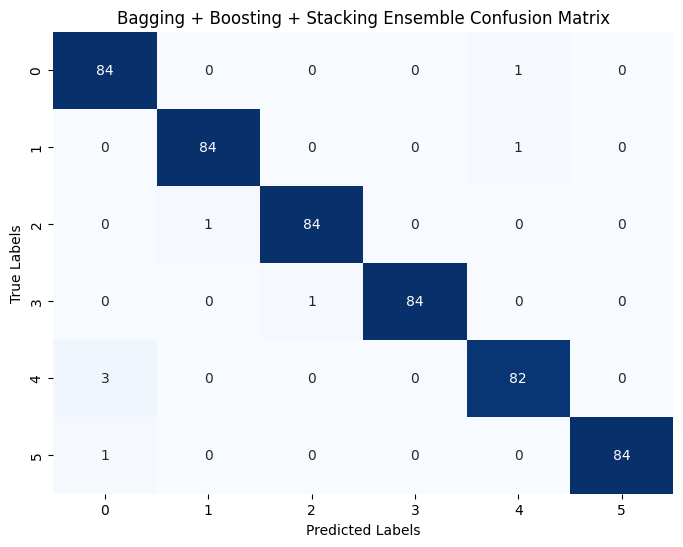

Class 0: Sensitivity = 0.9882, Specificity = 0.9906
Class 1: Sensitivity = 0.9882, Specificity = 0.9976
Class 2: Sensitivity = 0.9882, Specificity = 0.9976
Class 3: Sensitivity = 0.9882, Specificity = 1.0000
Class 4: Sensitivity = 0.9647, Specificity = 0.9953
Class 5: Sensitivity = 0.9882, Specificity = 1.0000

Macro-Average AUC: 0.9995
=== Fairness Matrix by Gender ===

Gender: Male
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 1.0000 | 0.0145 | 0.9318
    1 | 1.0000 | 0.0047 | 0.9722
    2 | 0.0000 | 0.0000 | 0.0000
    3 | 1.0000 | 0.0000 | 1.0000
    4 | 0.9231 | 0.0000 | 1.0000
    5 | 1.0000 | 0.0000 | 1.0000

Gender: Female
Class | TPR     | FPR     | Precision
--------------------------------
    0 | 0.9773 | 0.0046 | 0.9773
    1 | 0.9800 | 0.0000 | 1.0000
    2 | 1.0000 | 0.0056 | 0.9882
    3 | 0.0000 | 0.0000 | 0.0000
    4 | 1.0000 | 0.0093 | 0.9583
    5 | 0.9730 | 0.0000 | 1.0000

=== Gender Disparity Summary ===
Class 0: TPR diff = 0.022

In [30]:

bagging_model = BaggingClassifier(
    estimator=rf_model,
    n_estimators=10,
    max_samples=0.8,
    max_features=0.8,
    random_state=42,
    n_jobs=-1
)


boosting_model = AdaBoostClassifier(
    estimator=rf_model,
    n_estimators=50,
    learning_rate=0.1,
    random_state=42
)


opt_stack_model = StackingClassifier(
    estimators=[
        ('rf', rf_model),
        ('xgb', XGboost_model),
        ('cat', opt_cat_model),
        ('bag', bagging_model),
        ('boost', boosting_model)
    ],
    final_estimator=rf_model,  
    cv=5,
    n_jobs=-1,
    passthrough=True
)


opt_stack_model.fit(X_train, y_train)

y_pred = opt_stack_model.predict(X_test)

# If available, get probabilities
try:
    y_pred_probs = opt_stack_model.predict_proba(X_test)
except:
    y_pred_probs = None


train_acc = opt_stack_model.score(X_train, y_train)
val_acc = opt_stack_model.score(X_val, y_val)
test_acc = accuracy_score(y_test, y_pred)
diff = train_acc - val_acc

if train_acc < 0.7 and val_acc < 0.7:
    diagnosis = "High bias (underfitting)"
elif diff > 0.1:
    diagnosis = "High variance (overfitting)"
elif 0 <= diff <= 0.05:
    diagnosis = "Good fit"
elif 0.05 < diff <= 0.1:
    diagnosis = "Slight overfitting"
else:
    diagnosis = "Validation > Training, unusual case"

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Accuracy difference (train - val): {diff:.4f}")
print(f"Diagnosis: {diagnosis}")


precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy : {test_acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Bagging + Boosting + Stacking Ensemble Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

num_classes = len(np.unique(y_test))
sensitivity = []
specificity = []

for i in range(num_classes):
    TP = cm[i,i]
    FN = np.sum(cm[i,:]) - TP
    FP = np.sum(cm[:,i]) - TP
    TN = np.sum(cm) - (TP + FN + FP)
    
    sens = TP / (TP + FN) if (TP + FN) > 0 else 0
    spec = TN / (TN + FP) if (TN + FP) > 0 else 0
    
    sensitivity.append(sens)
    specificity.append(spec)

for i in range(num_classes):
    print(f"Class {i}: Sensitivity = {sensitivity[i]:.4f}, Specificity = {specificity[i]:.4f}")


if y_pred_probs is not None:
    y_test_bin = label_binarize(y_test, classes=np.arange(num_classes))
    auc = roc_auc_score(y_test_bin, y_pred_probs, average='macro', multi_class='ovr')
    print(f"\nMacro-Average AUC: {auc:.4f}")


def fairness_matrix_onehot_gender(y_true, y_pred_probs, X_test_df):
    gender_onehot = X_test_df[['gender_Female', 'gender_Male']].values
    gender = np.argmax(gender_onehot, axis=1)  # 0=Male, 1=Female
    y_true_idx = y_true
    y_pred_idx = np.argmax(y_pred_probs, axis=1)
    
    groups = np.unique(gender)
    classes = np.unique(y_true_idx)
    results = {g: {} for g in groups}
    
    for g in groups:
        idx = np.where(gender==g)
        y_true_g = y_true_idx[idx]
        y_pred_g = y_pred_idx[idx]
        for c in classes:
            TP = np.sum((y_pred_g==c) & (y_true_g==c))
            FN = np.sum((y_pred_g!=c) & (y_true_g==c))
            FP = np.sum((y_pred_g==c) & (y_true_g!=c))
            TN = np.sum((y_pred_g!=c) & (y_true_g!=c))
            TPR = TP / (TP+FN) if (TP+FN) > 0 else 0
            FPR = FP / (FP+TN) if (FP+TN) > 0 else 0
            Precision = TP / (TP+FP) if (TP+FP) > 0 else 0
            results[g][c] = {'TPR': TPR, 'FPR': FPR, 'Precision': Precision}
    
    print("=== Fairness Matrix by Gender ===")
    for g, class_metrics in results.items():
        gender_name = "Male" if g==0 else "Female"
        print(f"\nGender: {gender_name}")
        print("Class | TPR     | FPR     | Precision")
        print("-"*32)
        for c, metrics in class_metrics.items():
            print(f"{c:5d} | {metrics['TPR']:.4f} | {metrics['FPR']:.4f} | {metrics['Precision']:.4f}")
    
    return results

if y_pred_probs is not None:
    fairness_results = fairness_matrix_onehot_gender(y_test, y_pred_probs, X_test)

    # Gender Disparity Summary
    print("\n=== Gender Disparity Summary ===")
    for c in range(num_classes):
        tpr_diff = abs(fairness_results[0][c]['TPR'] - fairness_results[1][c]['TPR'])
        precision_diff = abs(fairness_results[0][c]['Precision'] - fairness_results[1][c]['Precision'])
        print(f"Class {c}: TPR diff = {tpr_diff:.4f}, Precision diff = {precision_diff:.4f}")
        if tpr_diff > 0.1 or precision_diff > 0.1:
            print(f" Significant disparity detected in Class {c}")


### model selection

Evaluating Opt_CatBoost ...
Evaluating XGBoost ...
Evaluating RandomForest ...
Evaluating LogisticRegression ...
Evaluating LSTM ...
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  
Evaluating MLP ...
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Evaluating Opt_Stacking ...

=== MODEL PERFORMANCE COMPARISON ===


,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity,Fairness_TPR_Diff,Fairness_Prec_Diff
Model,,,,,,,,,
Opt_CatBoost,0.9824,0.9825,0.9824,0.9824,0.9994,0.9824,0.9965,0.3540,0.3535
XGBoost,0.9863,0.9864,0.9863,0.9863,0.9995,0.9863,0.9973,0.3549,0.3409
RandomForest,0.9569,0.9578,0.9569,0.9572,0.9930,0.9569,0.9914,0.3676,0.3411
LogisticRegression,0.9412,0.9410,0.9412,0.9406,0.9943,0.9412,0.9882,0.3819,0.3586
LSTM,0.9373,0.9374,0.9373,0.9367,0.9945,0.9373,0.9875,0.3759,0.3739
MLP,0.9373,0.9376,0.9373,0.9373,0.9945,0.9373,0.9875,0.2218,0.1750
Opt_Stacking,0.9843,0.9845,0.9843,0.9844,0.9995,0.9843,0.9969,0.3578,0.3505


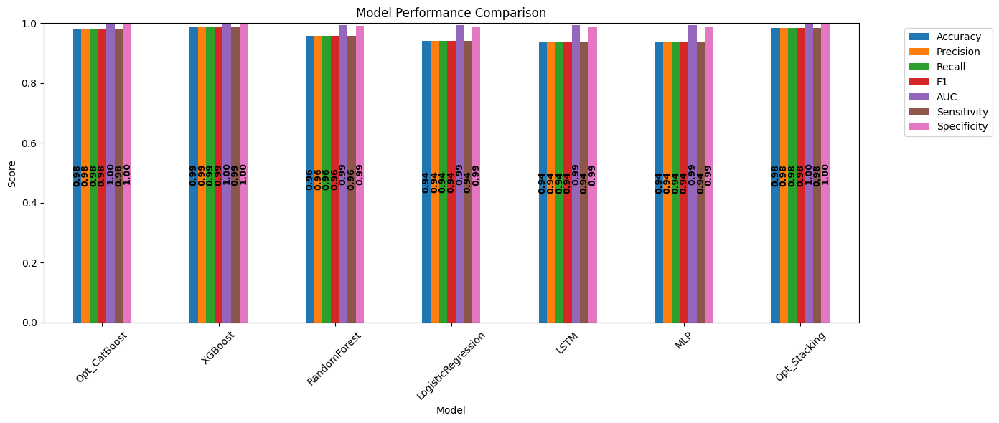

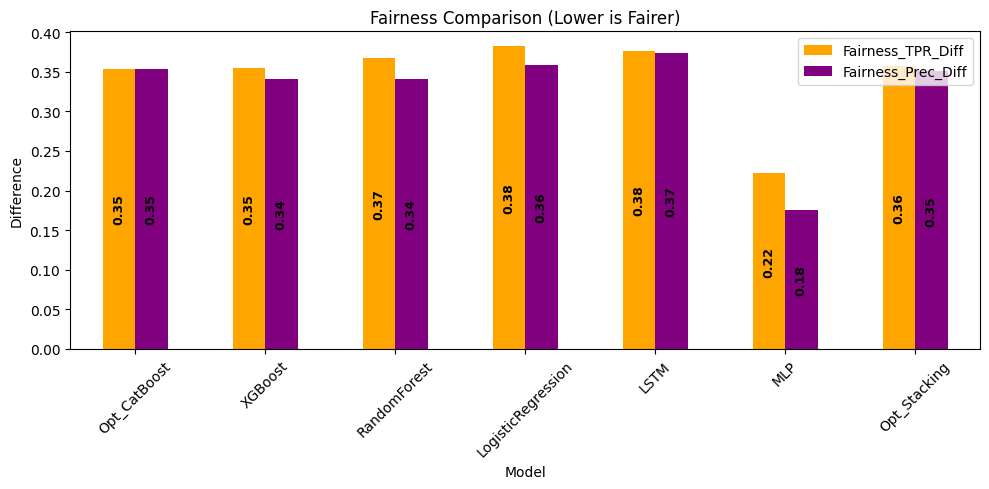

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


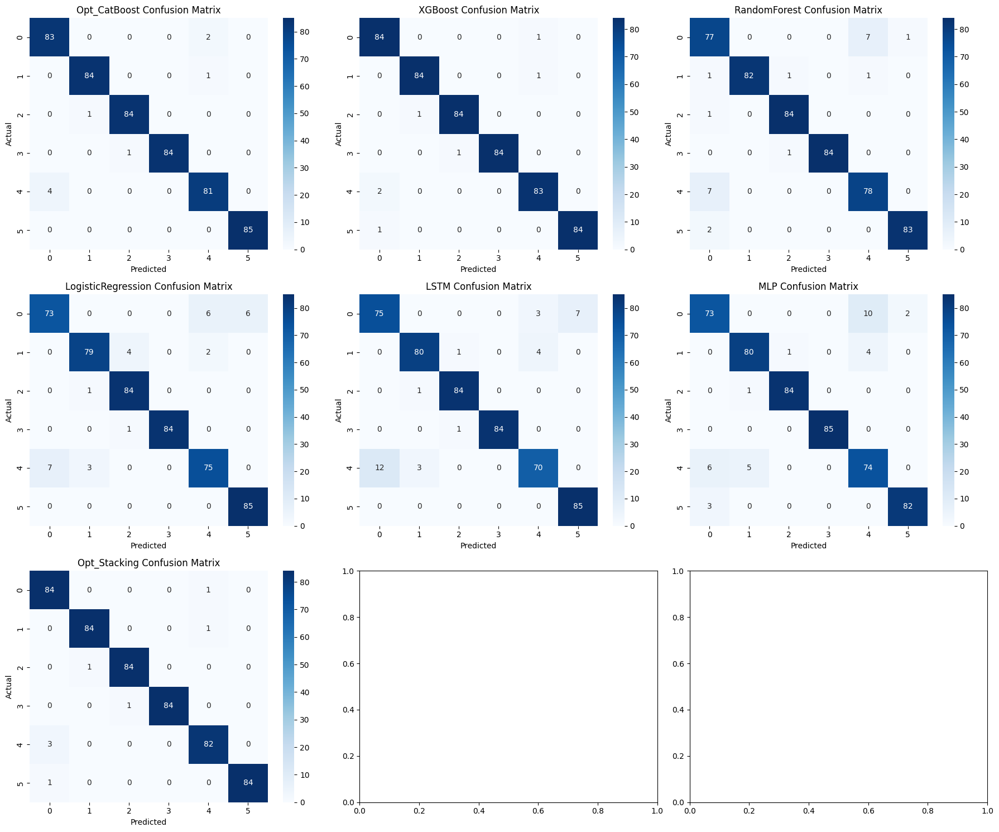


🏆 BEST MODEL SELECTED: XGBoost
Accuracy              0.9863
Precision             0.9864
Recall                0.9863
F1                    0.9863
AUC                   0.9995
Sensitivity           0.9863
Specificity           0.9973
Fairness_TPR_Diff     0.3549
Fairness_Prec_Diff    0.3409
CompositeScore        0.9191
Name: XGBoost, dtype: float64
✅ Model saved as best_model_XGBoost.pkl


In [31]:
import numpy as np  
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score, classification_report
)
from sklearn.preprocessing import label_binarize, StandardScaler
import joblib

# ===================== MODELS =====================
models = {
    'Opt_CatBoost': opt_cat_model,
    'XGBoost': XGboost_model,
    'RandomForest': rf_model,
    'LogisticRegression': lr_model,
    'LSTM': opt_lstm_model,
    'MLP': opt_mlp_model,
    'Opt_Stacking': opt_stack_model
}

# ===================== EVALUATION FUNCTION =====================
def evaluate_model(name, model, X_test, y_test):
    result = {'Model': name}

    if 'LSTM' in name or 'MLP' in name:
        X_input = X_test.values 
        if 'LSTM' in name:
            X_input = X_input.reshape((X_input.shape[0], 1, X_input.shape[1]))
    elif 'LogisticRegression' in name:
        scaler = StandardScaler()
        X_input = scaler.fit_transform(X_test)
    else:
        X_input = X_test

    y_pred = model.predict(X_input)

    if 'LSTM' in name or 'MLP' in name:
        if y_pred.shape[1] > 1:
            y_pred_classes = np.argmax(y_pred, axis=1)
        else:
            y_pred_classes = (y_pred > 0.5).astype(int).flatten()
        y_pred_probs = y_pred
    else:
        y_pred_classes = y_pred
        try:
            y_pred_probs = model.predict_proba(X_input)
        except:
            y_pred_probs = None

    result['Accuracy'] = accuracy_score(y_test, y_pred_classes)
    result['Precision'] = precision_score(y_test, y_pred_classes, average='weighted', zero_division=0)
    result['Recall'] = recall_score(y_test, y_pred_classes, average='weighted', zero_division=0)
    result['F1'] = f1_score(y_test, y_pred_classes, average='weighted', zero_division=0)

    try:
        num_classes = len(np.unique(y_test))
        y_test_bin = label_binarize(y_test, classes=np.arange(num_classes))
        result['AUC'] = roc_auc_score(y_test_bin, y_pred_probs, average='macro', multi_class='ovr')
    except:
        result['AUC'] = np.nan

    cm = confusion_matrix(y_test, y_pred_classes)
    sens_list, spec_list = [], []
    for i in range(len(np.unique(y_test))):
        TP = cm[i,i]
        FN = np.sum(cm[i,:]) - TP
        FP = np.sum(cm[:,i]) - TP
        TN = np.sum(cm) - (TP+FN+FP)
        sens_list.append(TP / (TP+FN) if (TP+FN) > 0 else 0)
        spec_list.append(TN / (TN+FP) if (TN+FP) > 0 else 0)
    result['Sensitivity'] = np.mean(sens_list)
    result['Specificity'] = np.mean(spec_list)

    gender_cols = [c for c in X_test.columns if 'gender_' in c]
    if len(gender_cols) == 2 and y_pred_probs is not None:
        gender_onehot = X_test[gender_cols].values
        gender = np.argmax(gender_onehot, axis=1)
        y_pred_idx = np.argmax(y_pred_probs, axis=1)
        groups = np.unique(gender)
        tpr_diff_list, precision_diff_list = [], []
        for c in np.unique(y_test):
            TPRs, Precisions = [], []
            for g in groups:
                idx = np.where(gender==g)
                TP = np.sum((y_pred_idx[idx]==c) & (y_test[idx]==c))
                FN = np.sum((y_pred_idx[idx]!=c) & (y_test[idx]==c))
                FP = np.sum((y_pred_idx[idx]==c) & (y_test[idx]!=c))
                TPRs.append(TP / (TP+FN) if (TP+FN)>0 else 0)
                Precisions.append(TP / (TP+FP) if (TP+FP)>0 else 0)
            tpr_diff_list.append(abs(TPRs[0]-TPRs[1]))
            precision_diff_list.append(abs(Precisions[0]-Precisions[1]))
        result['Fairness_TPR_Diff'] = np.mean(tpr_diff_list)
        result['Fairness_Prec_Diff'] = np.mean(precision_diff_list)
    else:
        result['Fairness_TPR_Diff'] = np.nan
        result['Fairness_Prec_Diff'] = np.nan

    return result

# ===================== EVALUATE ALL MODELS =====================
results = []
for name, model in models.items():
    print(f"Evaluating {name} ...")
    res = evaluate_model(name, model, X_test, y_test)
    results.append(res)

results_df = pd.DataFrame(results)
results_df.set_index('Model', inplace=True)

print("\n=== MODEL PERFORMANCE COMPARISON ===")
display(results_df.round(4))

# ===================== BAR PLOTS WITH VERTICAL NUMBERS INSIDE =====================
metrics_to_plot = ['Accuracy','Precision','Recall','F1','AUC','Sensitivity','Specificity']
ax = results_df[metrics_to_plot].plot(kind='bar', figsize=(14,6), rot=45)
plt.title("Model Performance Comparison")
plt.ylabel("Score")
plt.ylim(0,1)

for p in ax.patches:
    height = p.get_height()
    if np.isnan(height):
        label = "--"
        height = 0
    else:
        label = f"{height:.2f}"
    ax.annotate(label, 
                (p.get_x() + p.get_width() / 2., height/2),
                ha='center', va='center', fontsize=9, color='black', rotation=90, fontweight='bold')

plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

# Fairness plots with vertical numbers inside
fairness_metrics = ['Fairness_TPR_Diff','Fairness_Prec_Diff']
ax2 = results_df[fairness_metrics].plot(kind='bar', figsize=(10,5), color=['orange','purple'])
plt.title("Fairness Comparison (Lower is Fairer)")
plt.ylabel("Difference")
plt.xticks(rotation=45)

for p in ax2.patches:
    height = p.get_height()
    if np.isnan(height):
        label = "--"
        height = 0
    else:
        label = f"{height:.2f}"
    ax2.annotate(label, 
                 (p.get_x() + p.get_width() / 2., height/2),
                 ha='center', va='center', fontsize=9, color='black', rotation=90, fontweight='bold')

plt.tight_layout()
plt.show()

# ===================== CONFUSION MATRICES =====================
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()
for i, (name, model) in enumerate(models.items()):
    if i >= len(axes): break
    if 'LSTM' in name or 'MLP' in name:
        X_input = X_test.values
        if 'LSTM' in name:
            X_input = X_input.reshape((X_input.shape[0], 1, X_input.shape[1]))
        y_pred = model.predict(X_input)
        if y_pred.shape[1] > 1:
            y_pred_classes = np.argmax(y_pred, axis=1)
        else:
            y_pred_classes = (y_pred > 0.5).astype(int).flatten()
    elif 'LogisticRegression' in name:
        X_input = StandardScaler().fit_transform(X_test)
        y_pred_classes = model.predict(X_input)
    else:
        y_pred_classes = model.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred_classes)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"{name} Confusion Matrix")
    axes[i].set_xlabel("Predicted")
    axes[i].set_ylabel("Actual")
plt.tight_layout()
plt.show()

# ===================== COMPOSITE SCORE =====================
results_df['CompositeScore'] = (
    0.2*results_df['Accuracy'] + 
    0.2*results_df['F1'] +
    0.15*results_df['Recall'] +
    0.15*results_df['Precision'] +
    0.1*results_df['AUC'].fillna(0) +
    0.1*results_df['Sensitivity'] +
    0.1*results_df['Specificity']
) - 0.1*(results_df['Fairness_TPR_Diff'].fillna(0) + results_df['Fairness_Prec_Diff'].fillna(0))

best_model_name = results_df['CompositeScore'].idxmax()
best_model = models[best_model_name]

print(f"\n🏆 BEST MODEL SELECTED: {best_model_name}")
print(results_df.loc[best_model_name].round(4))

joblib.dump(best_model, f'best_model_{best_model_name}.pkl')
print(f"✅ Model saved as best_model_{best_model_name}.pkl")


### 5. Explainable & Interpretable AI

In [32]:
# 1. Predictions
y_pred_probs = XGboost_model.predict_proba(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

sample_index = 0
predicted_label = y_pred[sample_index]

class_names = [
    'Normal_Weight',
    'Obesity_Type_I',
    'Obesity_Type_II',
    'Obesity_Type_III',
    'Over_weight',
    'Under_Weight'
]

print(f"Predicted Class for sample {sample_index}: {class_names[predicted_label]}")


# 2. LIME explainer
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=class_names,
    mode='classification'
)

sample = X_test.iloc[sample_index]

# 3. Generate explanation ONLY for predicted class
exp = explainer.explain_instance(
    data_row=sample.values,
    predict_fn=XGboost_model.predict_proba,
    num_features=20,
    labels=[predicted_label]   # Show only predicted class
)


# 4. Visualize with white background only for LIME cell
html_output = exp.as_html()
white_bg_div = f"""
<div style='background-color:white; padding:10px; border:1px solid #ccc;'>
{html_output}
</div>
"""

try:
    from IPython.display import HTML, display
    display(HTML(white_bg_div))
    print("LIME visualization displayed inline with white background for this cell only.")
except:
    with open("LIME_Explanation_XGBoost_WhiteCell.html", "w", encoding="utf-8") as f:
        f.write(white_bg_div)
    print("Saved as LIME_Explanation_XGBoost_WhiteCell.html")


# 5. Save permanent HTML
exp.save_to_file("LIME_Explanation_XGBoost_Sample0.html")
print(f"Predicted class: {class_names[predicted_label]}")


Predicted Class for sample 0: Obesity_Type_III


LIME visualization displayed inline with white background for this cell only.
Predicted class: Obesity_Type_III


In [33]:
# 1. Predictions
y_pred_probs = XGboost_model.predict_proba(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

class_names = [
    'Normal_Weight',
    'Obesity_Type_I',
    'Obesity_Type_II',
    'Obesity_Type_III',
    'Over_weight',
    'Under_Weight'
]

# 2. LIME Explainer
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=class_names,
    mode='classification'
)

# 3. Select multiple samples to “click”
sample_indices = [0, 5, 10]  # Example: explain 3 samples

for idx in sample_indices:
    sample = X_test.iloc[idx]
    predicted_label = y_pred[idx]
    
    print(f"\n=== Sample {idx} ===")
    print(f"Predicted Class: {class_names[predicted_label]}")
    
    # Generate explanation for predicted class only
    exp = explainer.explain_instance(
        data_row=sample.values,
        predict_fn=XGboost_model.predict_proba,
        num_features=20,
        labels=[predicted_label]
    )
    
    # Display visualization inline with white background for the figure only
    html_output = exp.as_html()
    
    # Wrap LIME HTML in a div with white background
    html_white_div = f"""
    <div style='background-color:white; padding:10px; border:1px solid #ccc;'>
    {html_output}
    </div>
    """
    
    try:
        from IPython.display import HTML, display
        display(HTML(html_white_div))
        print("LIME visualization displayed with white background for this cell only.")
    except:
        # Fallback: save HTML
        filename = f"LIME_Explanation_Sample{idx}_White.html"
        with open(filename, "w", encoding="utf-8") as f:
            f.write(html_white_div)
        print(f"Saved LIME explanation for sample {idx} as {filename}")
    
    # Save permanent HTML (default)
    exp.save_to_file(f"LIME_Explanation_XGBoost_Sample{idx}.html")



=== Sample 0 ===
Predicted Class: Obesity_Type_III


LIME visualization displayed with white background for this cell only.

=== Sample 5 ===
Predicted Class: Over_weight


LIME visualization displayed with white background for this cell only.

=== Sample 10 ===
Predicted Class: Obesity_Type_II


LIME visualization displayed with white background for this cell only.


=== SHAP Model Explanation for Obesity Classification ===
This analysis explains how the AI model makes its predictions.

🔍 ANALYZING: OBESITY TYPE I

📊 SAMPLE ANALYSIS:
   • Actual Health Status: Obesity Type I
   • Model Prediction: Obesity Type I
   • Confidence Level: 99.9%

🧠 COMPUTING MODEL EXPLANATION...
Computing global SHAP values for summary plot...

📈 HOW THE MODEL DECIDED:
   Starting probability: 0.528
   Final probability: 0.999
   Features moved probability by: +0.471

🌍 GLOBAL MODEL BEHAVIOR - OBESITY TYPE I
   This shows what features are MOST IMPORTANT overall for predicting this condition:
   • DOT POSITION = Impact on prediction (left decreases, right increases)
   • DOT COLOR    = Feature value (red = high, blue = low)
   • VERTICAL SPREAD = How much the feature affects different patients


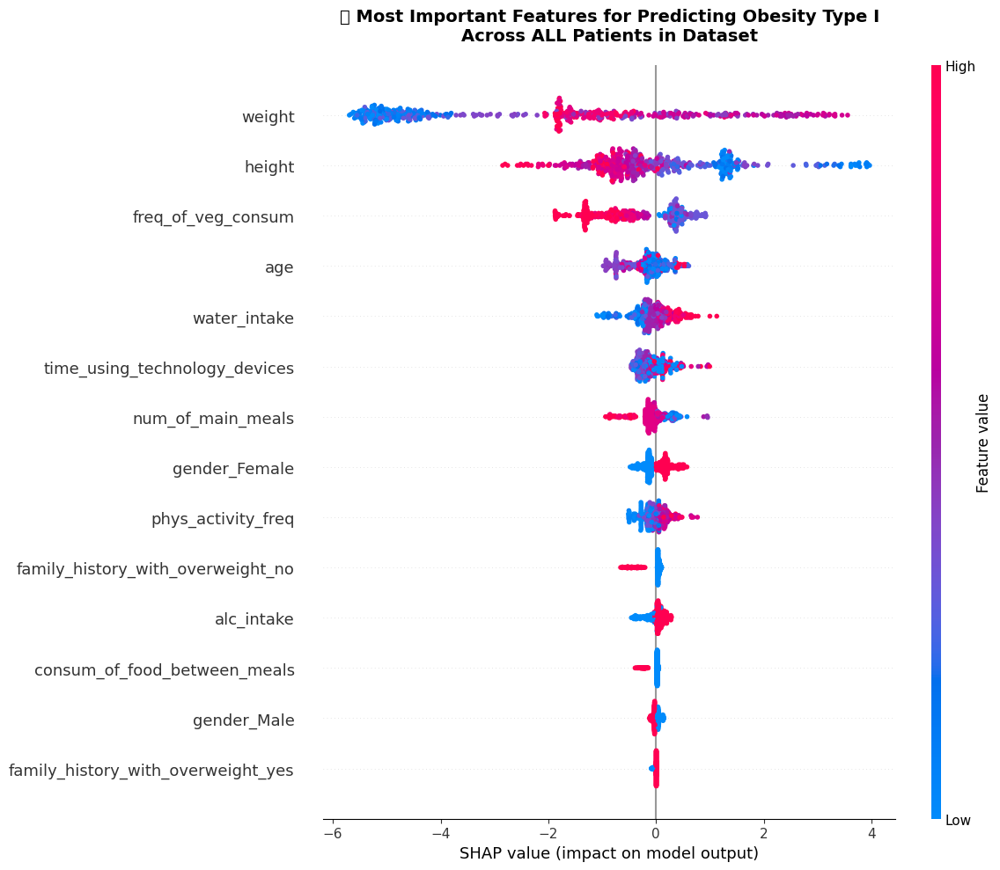

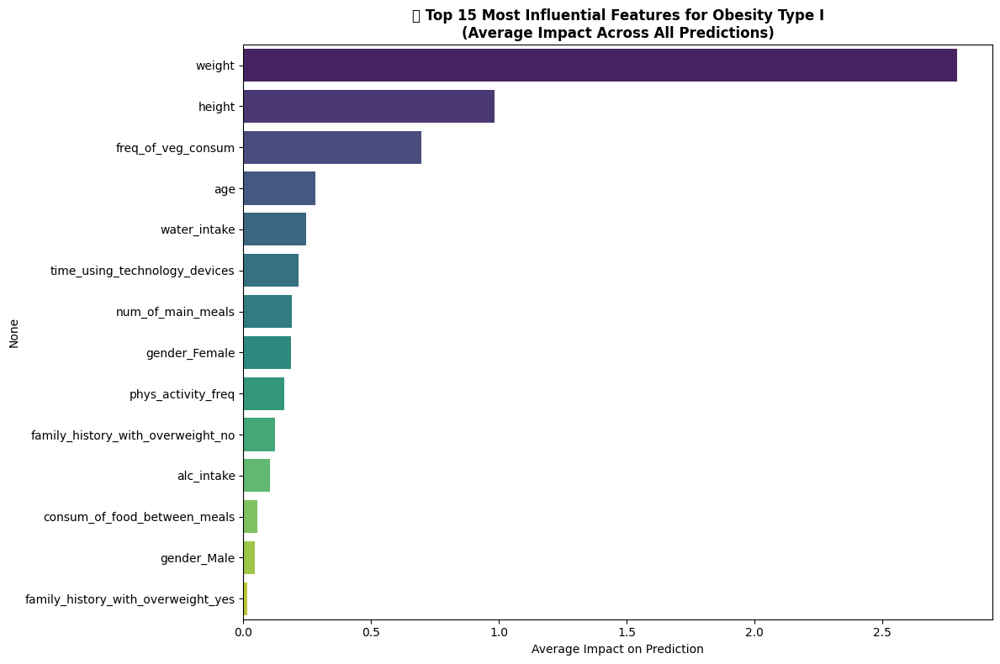


🎯 TOP FEATURES INFLUENCING THIS SPECIFIC PREDICTION:
   (Positive = Increases probability, Negative = Decreases probability)
--------------------------------------------------------------------------------
   height                    : +3.4182 (🟢 INCREASES)
   weight                    : +1.1327 (🟢 INCREASES)
   gender_Female             : +0.5251 (🟢 INCREASES)
   alc_intake                : -0.4032 (🔴 DECREASES)
   num_of_main_meals         : +0.3724 (🟢 INCREASES)
   time_using_technology_devices : +0.2756 (🟢 INCREASES)
   water_intake              : +0.1684 (🟢 INCREASES)
   freq_of_veg_consum        : -0.1665 (🔴 DECREASES)

📊 VISUAL EXPLANATION FOR THIS PATIENT:
   The chart below shows how each feature moves THIS PATIENT'S prediction:
   • LEFT (Red)  = Features that DECREASE probability of {target_class_name}
   • RIGHT (Blue) = Features that INCREASE probability of {target_class_name}
   • BAR LENGTH   = Strength of the feature's influence
   • BASE VALUE   = Starting probabilit

<Figure size 1400x800 with 0 Axes>

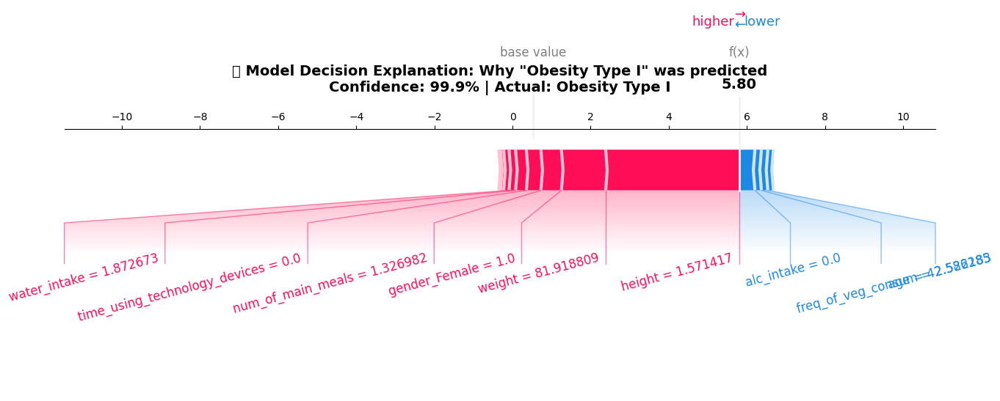


📋 DETAILED FEATURE BREAKDOWN FOR THIS PATIENT:
   This chart shows the exact contribution of each feature:
   • Positive values = Push toward {target_class_name}
   • Negative values = Push away from {target_class_name}
   • Cumulative effect = How probability changes step by step


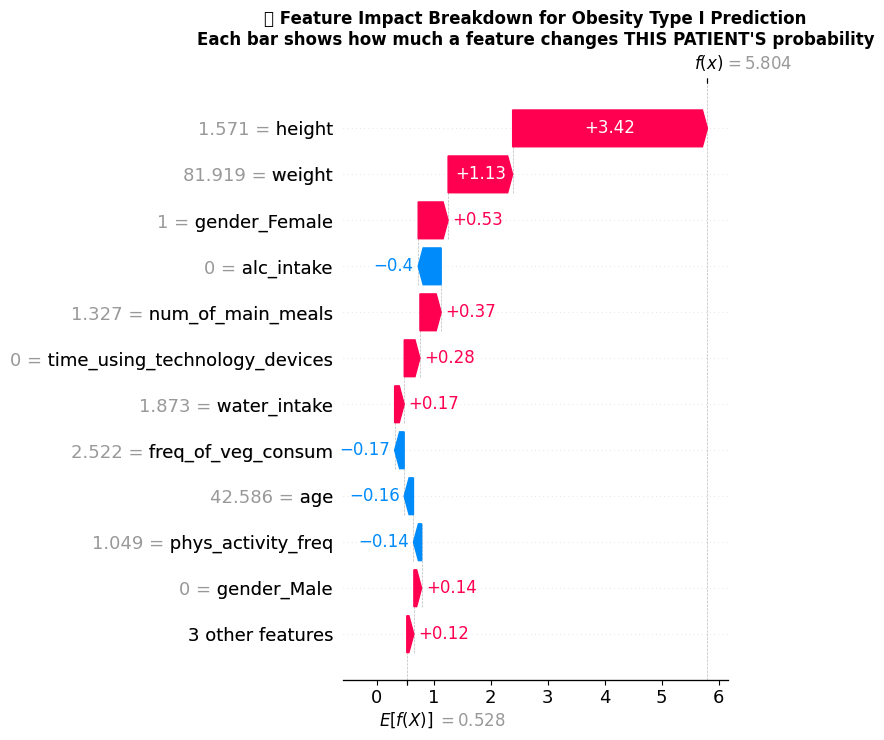


🎯 DECISION PATH FOR THIS PATIENT:
   This chart shows the STEP-BY-STEP decision process:
   • LEFT → RIGHT = How probability builds up feature by feature
   • EACH LINE    = Contribution of one feature
   • FINAL VALUE  = Total probability after all features
   • GREEN LINES  = Features increasing probability
   • RED LINES    = Features decreasing probability


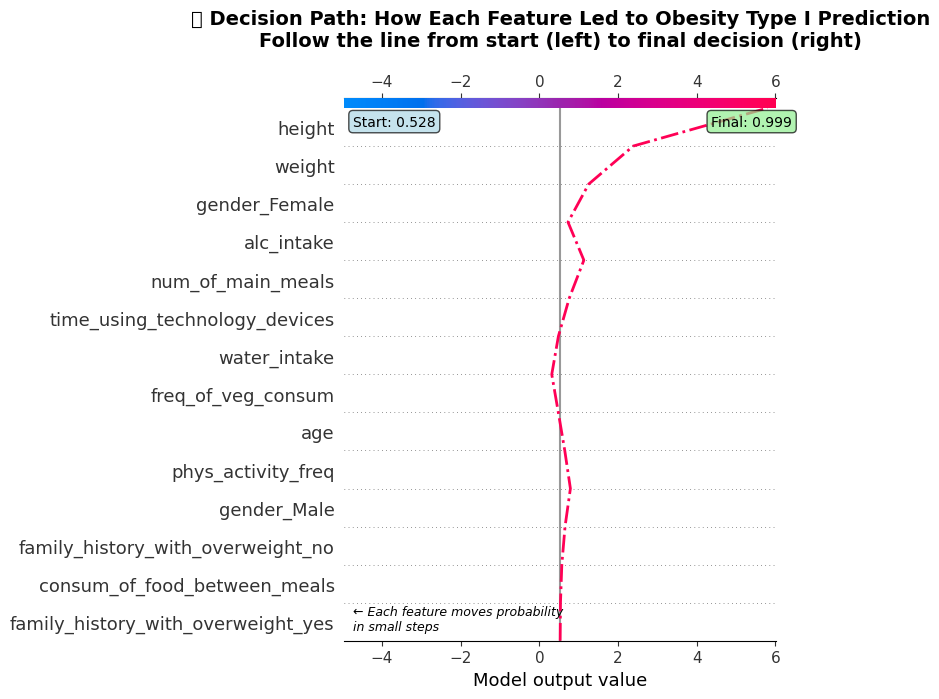


🎯 KEY TAKEAWAYS FOR THIS PATIENT:

   Features STRONGEST supporting Obesity Type I prediction:
   ✓ height (impact: +3.418)
   ✓ weight (impact: +1.133)

   Features REDUCING confidence in Obesity Type I prediction:
   ✗ alc_intake (impact: -0.403)
   ✗ freq_of_veg_consum (impact: -0.167)

   📊 Overall trend for this patient:
   • Total supporting evidence: +6.153
   • Total contradicting evidence: -0.877
   • Net effect: +5.276
   • Model confidence: HIGH confidence

   🎯 DECISION PATH SUMMARY:
   • Starting point: 0.528 probability
   • After considering all features: 0.999 probability
   • Key turning points: See the decision plot above

🌍 COMPARISON WITH GLOBAL PATTERNS:
   Shared important features: height, weight
   → This patient follows the general pattern the model learned

✅ EXPLANATION COMPLETE

💡 To analyze a different obesity type, change TARGET_CLASS to:
   0 = Normal Weight
   2 = Obesity Type II
   3 = Obesity Type III
   4 = Overweight
   5 = Underweight


In [48]:
# SHAP Explainability for XGBoost Obesity Classification - Simple & Clear
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap

# --------- Class Mapping ---------
class_mapping = {
    0: 'Normal Weight',
    1: 'Obesity Type I', 
    2: 'Obesity Type II',
    3: 'Obesity Type III',
    4: 'Overweight',
    5: 'Underweight'
}

print("=== SHAP Model Explanation for Obesity Classification ===")
print("This analysis explains how the AI model makes its predictions.\n")

# Get model predictions
y_pred = XGboost_model.predict(X_test)
y_pred_proba = XGboost_model.predict_proba(X_test)

# Let's analyze predictions for a specific class
TARGET_CLASS = 1  # Change this to analyze different obesity types (0-5)
target_class_name = class_mapping[TARGET_CLASS]

print(f"🔍 ANALYZING: {target_class_name.upper()}")

# Find one sample predicted as the target class
predicted_as_target = y_pred == TARGET_CLASS
target_indices = np.where(predicted_as_target)[0]

if len(target_indices) == 0:
    print(f"No samples predicted as {target_class_name}. Using actual class samples...")
    target_indices = np.where(y_test == TARGET_CLASS)[0]

if len(target_indices) > 0:
    # Select ONLY ONE sample for clear explanation
    sample_idx = target_indices[0]
    
    # Get sample information
    if hasattr(y_test, 'iloc'):
        actual_class = y_test.iloc[sample_idx]
    else:
        actual_class = y_test[sample_idx]
        
    predicted_class = y_pred[sample_idx]
    probability = y_pred_proba[sample_idx, TARGET_CLASS]
    
    actual_class_name = class_mapping.get(actual_class, f"Class {actual_class}")
    predicted_class_name = class_mapping.get(predicted_class, f"Class {predicted_class}")
    
    print(f"\n📊 SAMPLE ANALYSIS:")
    print(f"   • Actual Health Status: {actual_class_name}")
    print(f"   • Model Prediction: {predicted_class_name}")
    print(f"   • Confidence Level: {probability:.1%}")
    
    # --------- SHAP Analysis for One Sample ---------
    print(f"\n🧠 COMPUTING MODEL EXPLANATION...")
    
    # Create SHAP explainer
    explainer = shap.TreeExplainer(XGboost_model)
    
    # Get the single sample
    if hasattr(X_test, 'iloc'):
        sample_data = X_test.iloc[sample_idx:sample_idx+1]  # Get as DataFrame with one row
    else:
        sample_data = X_test[sample_idx:sample_idx+1]
    
    # Compute SHAP values for the single sample
    try:
        shap_values_single = explainer(sample_data)
        shap_vals_single = shap_values_single.values
    except:
        shap_values_single = explainer.shap_values(sample_data)
        shap_vals_single = shap_values_single

    # Compute SHAP values for all test data for summary plot
    print("Computing global SHAP values for summary plot...")
    shap_global = explainer(X_test)
    if hasattr(shap_global, 'values'):
        shap_global_array = shap_global.values
    else:
        shap_global_array = shap_global

    # Extract SHAP values for this sample and target class
    if shap_vals_single.ndim == 3:
        sample_shap = shap_vals_single[0, :, TARGET_CLASS]  # First sample, all features, target class
    else:
        sample_shap = shap_vals_single[0, :]
    
    # Get base value (starting point)
    if hasattr(explainer.expected_value, '__len__') and len(explainer.expected_value) > 1:
        base_value = explainer.expected_value[TARGET_CLASS]
    else:
        base_value = explainer.expected_value
    
    print(f"\n📈 HOW THE MODEL DECIDED:")
    print(f"   Starting probability: {base_value:.3f}")
    print(f"   Final probability: {probability:.3f}")
    print(f"   Features moved probability by: {probability - base_value:+.3f}")
    
    # --------- GLOBAL SUMMARY PLOT ---------
    print(f"\n🌍 GLOBAL MODEL BEHAVIOR - {target_class_name.upper()}")
    print("   This shows what features are MOST IMPORTANT overall for predicting this condition:")
    print("   • DOT POSITION = Impact on prediction (left decreases, right increases)")
    print("   • DOT COLOR    = Feature value (red = high, blue = low)")
    print("   • VERTICAL SPREAD = How much the feature affects different patients")
    
    if shap_global_array.ndim == 3:
        # For multi-class, use SHAP values for our target class
        class_shap_values = shap_global_array[:, :, TARGET_CLASS]
        
        plt.figure(figsize=(12, 10))
        shap.summary_plot(class_shap_values, X_test, 
                         feature_names=X_train.columns.tolist(), 
                         show=False,
                         plot_size=(12, 10))
        plt.title(f'🌍 Most Important Features for Predicting {target_class_name}\n'
                 f'Across ALL Patients in Dataset', 
                 fontsize=14, fontweight='bold', pad=20)
        plt.tight_layout()
        plt.show()
        
        # Also show bar plot for feature importance
        plt.figure(figsize=(12, 8))
        mean_abs_shap = np.mean(np.abs(class_shap_values), axis=0)
        feature_importance = pd.Series(mean_abs_shap, index=X_train.columns).sort_values(ascending=False)
        
        sns.barplot(x=feature_importance.values[:15], y=feature_importance.index[:15], palette='viridis')
        plt.title(f'📊 Top 15 Most Influential Features for {target_class_name}\n'
                 f'(Average Impact Across All Predictions)', 
                 fontsize=12, fontweight='bold')
        plt.xlabel('Average Impact on Prediction')
        plt.tight_layout()
        plt.show()
        
    else:
        # Single output
        plt.figure(figsize=(12, 10))
        shap.summary_plot(shap_global_array, X_test, 
                         feature_names=X_train.columns.tolist(), 
                         show=False)
        plt.title(f'🌍 Most Important Features for Predictions\n'
                 f'Across ALL Patients in Dataset', 
                 fontsize=14, fontweight='bold', pad=20)
        plt.tight_layout()
        plt.show()
    
    # Create feature contribution analysis for the single sample
    feature_contrib = pd.DataFrame({
        'Feature': X_train.columns,
        'Value': sample_data.values[0] if hasattr(sample_data, 'values') else sample_data[0],
        'Impact': sample_shap
    })
    feature_contrib['Absolute_Impact'] = np.abs(feature_contrib['Impact'])
    feature_contrib = feature_contrib.sort_values('Absolute_Impact', ascending=False)
    
    print(f"\n🎯 TOP FEATURES INFLUENCING THIS SPECIFIC PREDICTION:")
    print("   (Positive = Increases probability, Negative = Decreases probability)")
    print("-" * 80)
    
    top_features = feature_contrib.head(8)
    for _, row in top_features.iterrows():
        impact = row['Impact']
        direction = "🟢 INCREASES" if impact > 0 else "🔴 DECREASES"
        print(f"   {row['Feature']:25} : {impact:+.4f} ({direction})")
    
    # --------- ENHANCED FORCE PLOT WITH EXPLANATION ---------
    print(f"\n📊 VISUAL EXPLANATION FOR THIS PATIENT:")
    print("   The chart below shows how each feature moves THIS PATIENT'S prediction:")
    print("   • LEFT (Red)  = Features that DECREASE probability of {target_class_name}")
    print("   • RIGHT (Blue) = Features that INCREASE probability of {target_class_name}")
    print("   • BAR LENGTH   = Strength of the feature's influence")
    print("   • BASE VALUE   = Starting probability before considering features")
    
    plt.figure(figsize=(14, 8))
    
    # Create the force plot
    shap.force_plot(base_value, 
                   sample_shap, 
                   sample_data.values[0] if hasattr(sample_data, 'values') else sample_data[0],
                   feature_names=X_train.columns.tolist(),
                   matplotlib=True,
                   show=False,
                   text_rotation=15,
                   figsize=(14, 6))
    
    plt.title(f'🔍 Model Decision Explanation: Why "{predicted_class_name}" was predicted\n'
             f'Confidence: {probability:.1%} | Actual: {actual_class_name}', 
             fontsize=14, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()
    
    # --------- ENHANCED WATERFALL PLOT ---------
    print(f"\n📋 DETAILED FEATURE BREAKDOWN FOR THIS PATIENT:")
    print("   This chart shows the exact contribution of each feature:")
    print("   • Positive values = Push toward {target_class_name}")
    print("   • Negative values = Push away from {target_class_name}")
    print("   • Cumulative effect = How probability changes step by step")
    
    plt.figure(figsize=(12, 8))
    
    if shap_vals_single.ndim == 3:
        shap.plots.waterfall(shap_values_single[0, :, TARGET_CLASS], 
                           max_display=12,
                           show=False)
    else:
        shap.plots.waterfall(shap_values_single[0], 
                           max_display=12,
                           show=False)
    
    plt.title(f'📊 Feature Impact Breakdown for {predicted_class_name} Prediction\n'
             f'Each bar shows how much a feature changes THIS PATIENT\'S probability', 
             fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # --------- DECISION PLOT WITH CLEAR EXPLANATION ---------
    print(f"\n🎯 DECISION PATH FOR THIS PATIENT:")
    print("   This chart shows the STEP-BY-STEP decision process:")
    print("   • LEFT → RIGHT = How probability builds up feature by feature")
    print("   • EACH LINE    = Contribution of one feature")
    print("   • FINAL VALUE  = Total probability after all features")
    print("   • GREEN LINES  = Features increasing probability")
    print("   • RED LINES    = Features decreasing probability")
    
    plt.figure(figsize=(14, 10))
    
    # Prepare data for decision plot
    if shap_vals_single.ndim == 3:
        # For multi-class
        expected_value = explainer.expected_value[TARGET_CLASS] if hasattr(explainer.expected_value, '__len__') and len(explainer.expected_value) > 1 else explainer.expected_value
        
        shap.decision_plot(expected_value,
                         shap_vals_single[0, :, TARGET_CLASS].reshape(1, -1),
                         feature_names=X_train.columns.tolist(),
                         feature_order='importance',
                         highlight=0,
                         show=False)
    else:
        # For single output
        shap.decision_plot(explainer.expected_value,
                         shap_vals_single[0, :].reshape(1, -1),
                         feature_names=X_train.columns.tolist(),
                         feature_order='importance',
                         highlight=0,
                         show=False)
    
    plt.title(f'🎯 Decision Path: How Each Feature Led to {predicted_class_name} Prediction\n'
             f'Follow the line from start (left) to final decision (right)', 
             fontsize=14, fontweight='bold', pad=20)
    
    # Add custom legend and explanations
    plt.annotate(f'Start: {base_value:.3f}', xy=(0.02, 0.95), xycoords='axes fraction', 
                fontsize=10, bbox=dict(boxstyle="round,pad=0.3", fc="lightblue", alpha=0.7))
    plt.annotate(f'Final: {probability:.3f}', xy=(0.85, 0.95), xycoords='axes fraction', 
                fontsize=10, bbox=dict(boxstyle="round,pad=0.3", fc="lightgreen", alpha=0.7))
    plt.annotate('← Each feature moves probability\nin small steps', 
                xy=(0.02, 0.02), xycoords='axes fraction', fontsize=9, style='italic')
    
    plt.tight_layout()
    plt.show()
    
    # --------- SIMPLE SUMMARY FOR NON-TECHNICAL USERS ---------
    print(f"\n🎯 KEY TAKEAWAYS FOR THIS PATIENT:")
    
    # Find strongest positive and negative influences
    positive_effects = feature_contrib[feature_contrib['Impact'] > 0].head(2)
    negative_effects = feature_contrib[feature_contrib['Impact'] < 0].head(2)
    
    if len(positive_effects) > 0:
        print(f"\n   Features STRONGEST supporting {target_class_name} prediction:")
        for _, row in positive_effects.iterrows():
            print(f"   ✓ {row['Feature']} (impact: +{row['Impact']:.3f})")
    
    if len(negative_effects) > 0:
        print(f"\n   Features REDUCING confidence in {target_class_name} prediction:")
        for _, row in negative_effects.iterrows():
            print(f"   ✗ {row['Feature']} (impact: {row['Impact']:.3f})")
    
    # Overall assessment
    total_positive = feature_contrib[feature_contrib['Impact'] > 0]['Impact'].sum()
    total_negative = feature_contrib[feature_contrib['Impact'] < 0]['Impact'].sum()
    
    print(f"\n   📊 Overall trend for this patient:")
    print(f"   • Total supporting evidence: +{total_positive:.3f}")
    print(f"   • Total contradicting evidence: {total_negative:.3f}")
    print(f"   • Net effect: {total_positive + total_negative:+.3f}")
    
    if probability > 0.7:
        confidence_level = "HIGH confidence"
    elif probability > 0.5:
        confidence_level = "MODERATE confidence" 
    else:
        confidence_level = "LOW confidence"
        
    print(f"   • Model confidence: {confidence_level}")
    
    # Decision path summary
    print(f"\n   🎯 DECISION PATH SUMMARY:")
    print(f"   • Starting point: {base_value:.3f} probability")
    print(f"   • After considering all features: {probability:.3f} probability")
    print(f"   • Key turning points: See the decision plot above")
    
    # Compare with global importance
    print(f"\n🌍 COMPARISON WITH GLOBAL PATTERNS:")
    global_top_features = feature_importance.head(5).index.tolist()
    patient_top_features = feature_contrib.head(5)['Feature'].tolist()
    
    common_features = set(global_top_features) & set(patient_top_features)
    if common_features:
        print(f"   Shared important features: {', '.join(common_features)}")
        print("   → This patient follows the general pattern the model learned")
    else:
        print("   → This patient has a unique pattern different from typical cases")
    
else:
    print(f"❌ No samples available for analysis of {target_class_name}")

print(f"\n✅ EXPLANATION COMPLETE")
print(f"\n💡 To analyze a different obesity type, change TARGET_CLASS to:")
for class_num, class_name in class_mapping.items():
    if class_num != TARGET_CLASS:
        print(f"   {class_num} = {class_name}")

=== SHAP Model Explanation for Obesity Classification ===
This analysis explains how the AI model makes its predictions.

🔍 ANALYZING: OBESITY TYPE I

📊 SAMPLE ANALYSIS:
   • Actual Health Status: Obesity Type I
   • Model Prediction: Obesity Type I
   • Confidence Level: 99.9%

🧠 COMPUTING MODEL EXPLANATION...

📊 CREATING COMPREHENSIVE EXPLANATION DASHBOARD...


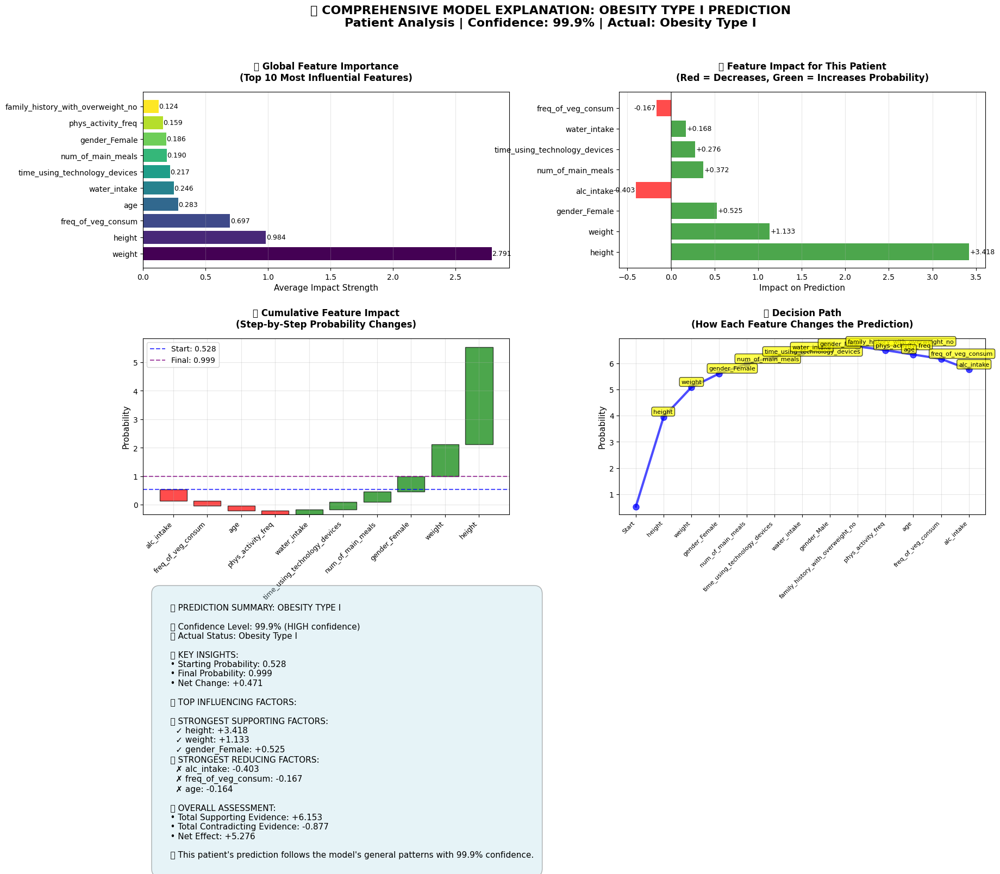


✅ COMPREHENSIVE EXPLANATION DASHBOARD CREATED!
📊 All visualization types combined into one easy-to-understand plot

💡 To analyze a different obesity type, change TARGET_CLASS to:
   0 = Normal Weight
   2 = Obesity Type II
   3 = Obesity Type III
   4 = Overweight
   5 = Underweight


In [53]:
# SHAP Explainability for XGBoost Obesity Classification - All in One Plot
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap

# --------- Class Mapping ---------
class_mapping = {
    0: 'Normal Weight',
    1: 'Obesity Type I', 
    2: 'Obesity Type II',
    3: 'Obesity Type III',
    4: 'Overweight',
    5: 'Underweight'
}

print("=== SHAP Model Explanation for Obesity Classification ===")
print("This analysis explains how the AI model makes its predictions.\n")

# Get model predictions
y_pred = XGboost_model.predict(X_test)
y_pred_proba = XGboost_model.predict_proba(X_test)

# Let's analyze predictions for a specific class
TARGET_CLASS = 1  # Change this to analyze different obesity types (0-5)
target_class_name = class_mapping[TARGET_CLASS]

print(f"🔍 ANALYZING: {target_class_name.upper()}")

# Find one sample predicted as the target class
predicted_as_target = y_pred == TARGET_CLASS
target_indices = np.where(predicted_as_target)[0]

if len(target_indices) == 0:
    print(f"No samples predicted as {target_class_name}. Using actual class samples...")
    target_indices = np.where(y_test == TARGET_CLASS)[0]

if len(target_indices) > 0:
    # Select ONLY ONE sample for clear explanation
    sample_idx = target_indices[0]
    
    # Get sample information
    if hasattr(y_test, 'iloc'):
        actual_class = y_test.iloc[sample_idx]
    else:
        actual_class = y_test[sample_idx]
        
    predicted_class = y_pred[sample_idx]
    probability = y_pred_proba[sample_idx, TARGET_CLASS]
    
    actual_class_name = class_mapping.get(actual_class, f"Class {actual_class}")
    predicted_class_name = class_mapping.get(predicted_class, f"Class {predicted_class}")
    
    print(f"\n📊 SAMPLE ANALYSIS:")
    print(f"   • Actual Health Status: {actual_class_name}")
    print(f"   • Model Prediction: {predicted_class_name}")
    print(f"   • Confidence Level: {probability:.1%}")
    
    # --------- SHAP Analysis ---------
    print(f"\n🧠 COMPUTING MODEL EXPLANATION...")
    
    # Create SHAP explainer
    explainer = shap.TreeExplainer(XGboost_model)
    
    # Get the single sample
    if hasattr(X_test, 'iloc'):
        sample_data = X_test.iloc[sample_idx:sample_idx+1]
    else:
        sample_data = X_test[sample_idx:sample_idx+1]
    
    # Compute SHAP values
    try:
        shap_values_single = explainer(sample_data)
        shap_vals_single = shap_values_single.values
    except:
        shap_values_single = explainer.shap_values(sample_data)
        shap_vals_single = shap_values_single

    # Compute global SHAP values
    shap_global = explainer(X_test)
    if hasattr(shap_global, 'values'):
        shap_global_array = shap_global.values
    else:
        shap_global_array = shap_global

    # Extract SHAP values for this sample
    if shap_vals_single.ndim == 3:
        sample_shap = shap_vals_single[0, :, TARGET_CLASS]
    else:
        sample_shap = shap_vals_single[0, :]
    
    # Get base value
    if hasattr(explainer.expected_value, '__len__') and len(explainer.expected_value) > 1:
        base_value = explainer.expected_value[TARGET_CLASS]
    else:
        base_value = explainer.expected_value
    
    # --------- CREATE SINGLE COMPREHENSIVE PLOT ---------
    print(f"\n📊 CREATING COMPREHENSIVE EXPLANATION DASHBOARD...")
    
    # Create figure with subplots
    fig = plt.figure(figsize=(20, 16))
    
    # Define the grid layout
    gs = plt.GridSpec(3, 2, figure=fig, hspace=0.4, wspace=0.3)
    
    # Plot 1: Global Feature Importance (Top-left)
    ax1 = fig.add_subplot(gs[0, 0])
    if shap_global_array.ndim == 3:
        class_shap_values = shap_global_array[:, :, TARGET_CLASS]
        mean_abs_shap = np.mean(np.abs(class_shap_values), axis=0)
        feature_importance = pd.Series(mean_abs_shap, index=X_train.columns).sort_values(ascending=False)
        
        # Take top 10 features for clarity
        top_features = feature_importance.head(10)
        colors = plt.cm.viridis(np.linspace(0, 1, len(top_features)))
        
        bars = ax1.barh(range(len(top_features)), top_features.values, color=colors)
        ax1.set_yticks(range(len(top_features)))
        ax1.set_yticklabels(top_features.index, fontsize=10)
        ax1.set_xlabel('Average Impact Strength', fontsize=11)
        ax1.set_title('🌍 Global Feature Importance\n(Top 10 Most Influential Features)', 
                     fontsize=12, fontweight='bold', pad=15)
        ax1.grid(axis='x', alpha=0.3)
        
        # Add value annotations
        for i, (bar, value) in enumerate(zip(bars, top_features.values)):
            ax1.text(value + 0.001, i, f'{value:.3f}', va='center', fontsize=9)
    
    # Plot 2: Force Plot (Top-right)
    ax2 = fig.add_subplot(gs[0, 1])
    # Create simplified force plot visualization
    feature_contrib = pd.DataFrame({
        'Feature': X_train.columns,
        'Impact': sample_shap
    })
    feature_contrib['Absolute_Impact'] = np.abs(feature_contrib['Impact'])
    feature_contrib = feature_contrib.sort_values('Absolute_Impact', ascending=False)
    
    # Take top 8 features for force plot
    top_force_features = feature_contrib.head(8)
    
    colors = ['red' if x < 0 else 'green' for x in top_force_features['Impact']]
    y_pos = range(len(top_force_features))
    
    bars = ax2.barh(y_pos, top_force_features['Impact'], color=colors, alpha=0.7)
    ax2.set_yticks(y_pos)
    ax2.set_yticklabels(top_force_features['Feature'], fontsize=10)
    ax2.axvline(x=0, color='black', linestyle='-', alpha=0.5)
    ax2.set_xlabel('Impact on Prediction', fontsize=11)
    ax2.set_title('📊 Feature Impact for This Patient\n(Red = Decreases, Green = Increases Probability)', 
                 fontsize=12, fontweight='bold', pad=15)
    ax2.grid(axis='x', alpha=0.3)
    
    # Add value annotations
    for i, (bar, impact) in enumerate(zip(bars, top_force_features['Impact'])):
        ax2.text(impact + (0.01 if impact > 0 else -0.01), i, f'{impact:+.3f}', 
                va='center', fontsize=9, 
                ha='left' if impact > 0 else 'right')
    
    # Plot 3: Waterfall Plot (Middle-left)
    ax3 = fig.add_subplot(gs[1, 0])
    # Create simplified waterfall plot
    top_waterfall = feature_contrib.head(10).sort_values('Impact', ascending=True)
    
    # Calculate cumulative effect
    cumulative = base_value
    waterfalls = []
    for impact in top_waterfall['Impact']:
        waterfalls.append((cumulative, cumulative + impact))
        cumulative += impact
    
    # Plot waterfall
    for i, ((start, end), feature, impact) in enumerate(zip(waterfalls, top_waterfall['Feature'], top_waterfall['Impact'])):
        color = 'green' if impact > 0 else 'red'
        ax3.bar(i, end - start, bottom=start, color=color, alpha=0.7, edgecolor='black')
        # Add connecting lines
        if i < len(waterfalls) - 1:
            ax3.plot([i + 0.5, i + 0.5], [end, waterfalls[i+1][0]], 'gray', linestyle='--', alpha=0.7)
    
    ax3.axhline(y=base_value, color='blue', linestyle='--', alpha=0.7, label=f'Start: {base_value:.3f}')
    ax3.axhline(y=probability, color='purple', linestyle='--', alpha=0.7, label=f'Final: {probability:.3f}')
    ax3.set_xticks(range(len(top_waterfall)))
    ax3.set_xticklabels(top_waterfall['Feature'], rotation=45, ha='right', fontsize=9)
    ax3.set_ylabel('Probability', fontsize=11)
    ax3.set_title('📋 Cumulative Feature Impact\n(Step-by-Step Probability Changes)', 
                 fontsize=12, fontweight='bold', pad=15)
    ax3.legend()
    ax3.grid(alpha=0.3)
    
    # Plot 4: Decision Plot (Middle-right)
    ax4 = fig.add_subplot(gs[1, 1])
    # Create simplified decision plot
    top_decision = feature_contrib.head(12).sort_values('Impact', ascending=False)
    
    # Calculate cumulative values
    cumulative_values = [base_value]
    current = base_value
    for impact in top_decision['Impact']:
        current += impact
        cumulative_values.append(current)
    
    # Plot decision path
    x_pos = range(len(cumulative_values))
    ax4.plot(x_pos, cumulative_values, 'o-', linewidth=3, markersize=8, color='blue', alpha=0.7)
    
    # Add feature labels at each step
    for i, (feature, impact) in enumerate(zip(top_decision['Feature'], top_decision['Impact'])):
        ax4.annotate(feature, (i+0.5, cumulative_values[i+1]), 
                    xytext=(5, 5), textcoords='offset points', fontsize=8,
                    bbox=dict(boxstyle="round,pad=0.3", fc="yellow", alpha=0.7))
    
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(['Start'] + list(top_decision['Feature']), rotation=45, ha='right', fontsize=8)
    ax4.set_ylabel('Probability', fontsize=11)
    ax4.set_title('🎯 Decision Path\n(How Each Feature Changes the Prediction)', 
                 fontsize=12, fontweight='bold', pad=15)
    ax4.grid(alpha=0.3)
    
    # Plot 5: Summary Statistics (Bottom)
    ax5 = fig.add_subplot(gs[2, :])
    ax5.axis('off')  # Turn off axis for text display
    
    # Create summary text
    summary_text = f"""
    🎯 PREDICTION SUMMARY: {predicted_class_name.upper()}
    
    📊 Confidence Level: {probability:.1%} ({'HIGH' if probability > 0.7 else 'MODERATE' if probability > 0.5 else 'LOW'} confidence)
    🎯 Actual Status: {actual_class_name}
    
    🔍 KEY INSIGHTS:
    • Starting Probability: {base_value:.3f}
    • Final Probability: {probability:.3f}
    • Net Change: {probability - base_value:+.3f}
    
    📈 TOP INFLUENCING FACTORS:
    """
    
    # Add top 3 positive and negative factors
    positive_factors = feature_contrib[feature_contrib['Impact'] > 0].head(3)
    negative_factors = feature_contrib[feature_contrib['Impact'] < 0].head(3)
    
    if len(positive_factors) > 0:
        summary_text += "\n    🟢 STRONGEST SUPPORTING FACTORS:"
        for _, row in positive_factors.iterrows():
            summary_text += f"\n      ✓ {row['Feature']}: +{row['Impact']:.3f}"
    
    if len(negative_factors) > 0:
        summary_text += "\n    🔴 STRONGEST REDUCING FACTORS:"
        for _, row in negative_factors.iterrows():
            summary_text += f"\n      ✗ {row['Feature']}: {row['Impact']:.3f}"
    
    # Add overall assessment
    total_positive = feature_contrib[feature_contrib['Impact'] > 0]['Impact'].sum()
    total_negative = feature_contrib[feature_contrib['Impact'] < 0]['Impact'].sum()
    
    summary_text += f"""
    
    📊 OVERALL ASSESSMENT:
    • Total Supporting Evidence: +{total_positive:.3f}
    • Total Contradicting Evidence: {total_negative:.3f}
    • Net Effect: {total_positive + total_negative:+.3f}
    
    💡 This patient's prediction follows the model's general patterns with {probability:.1%} confidence.
    """
    
    ax5.text(0.02, 0.95, summary_text, transform=ax5.transAxes, fontsize=11, 
             verticalalignment='top', bbox=dict(boxstyle="round,pad=1.0", facecolor="lightblue", alpha=0.3))
    
    # Main title
    plt.suptitle(f'🧠 COMPREHENSIVE MODEL EXPLANATION: {target_class_name.upper()} PREDICTION\n'
                f'Patient Analysis | Confidence: {probability:.1%} | Actual: {actual_class_name}', 
                fontsize=16, fontweight='bold', y=0.98)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n✅ COMPREHENSIVE EXPLANATION DASHBOARD CREATED!")
    print(f"📊 All visualization types combined into one easy-to-understand plot")
    
else:
    print(f"❌ No samples available for analysis of {target_class_name}")

print(f"\n💡 To analyze a different obesity type, change TARGET_CLASS to:")
for class_num, class_name in class_mapping.items():
    if class_num != TARGET_CLASS:
        print(f"   {class_num} = {class_name}")

In [ ]:
== SHAP Model Explanation for Obesity Classification ===
This analysis explains how the AI model makes its predictions.

🔍 ANALYZING: OBESITY TYPE I

📊 SAMPLE ANALYSIS:
   • Actual Health Status: Obesity Type I
   • Model Prediction: Obesity Type I
   • Confidence Level: 99.9%

🧠 COMPUTING MODEL EXPLANATION...

📊 CREATING COMPREHENSIVE EXPLANATION DASHBOARD...

✅ COMPREHENSIVE EXPLANATION DASHBOARD CREATED!
📊 All visualization types combined into one easy-to-understand plot

💡 To analyze a different obesity type, change TARGET_CLASS to:
   0 = Normal Weight
   2 = Obesity Type II
   3 = Obesity Type III
   4 = Overweight
   5 = Underweight